# Import Libraries

In [1]:
#==============================
# IMPORT LIBRARIES
#==============================

# Data Collection
#==============================
import yfinance as yf   #Download historical cryptocurrency data
import pandas as pd   #Data manipulation and analysis
import numpy as np   #Numerical computing
from datetime import date   #Handle dates
from tqdm import tqdm   #Progress bar for loops

# Data Scaling
#==============================
from sklearn.preprocessing import StandardScaler   #Standardize features by removing the mean and scaling to unit variance
from sklearn.preprocessing import MinMaxScaler   #Scale features to a fixed range

#Technical Indicators
#==============================
from ta.volatility import AverageTrueRange   #Average True Range (ATR) 
from ta.momentum import RSIIndicator   #Relative Strength Index (RSI) 
from ta.trend import MACD   #Moving Average Convergence Divergence (MACD) 

#Statistical Analysis
#==============================
from scipy import stats
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score
)

# Data Visualization
#==============================
import matplotlib.pyplot as plt
import seaborn as sns

#Warning Settings
#==============================
import warnings
warnings.filterwarnings("ignore")

In [2]:
#==============================
# SETTINGS
#==============================
#pandas. (2026a). Options and settings. [online] Available at: https://pandas.pydata.org/docs/user_guide/options.html.

'''Adjust the width of column for model performance display later'''

pd.set_option('display.max_colwidth', None)

# 1. Data Collection

In [3]:
#==============================
# DOWNLOAD CRYPTOCURRENCY DATA
#==============================

'''Collect data of Top 30 cryptocurrencies by market capitalization 
on 3/1/2021 on Coinmarketcap due to historical data availability'''

# Top 30 chosen cryptocurrencies
#==============================

crypto_tickers = [

    "BTC-USD",
    "ETH-USD",
    "LTC-USD",
    "XRP-USD",
    "DOT-USD",
    "ADA-USD",
    "BNB-USD",
    "LINK-USD",
    "XLM-USD",
    "EOS-USD",
    "XMR-USD",
    "THETA-USD",
    "TRX-USD",
    "XEM-USD",
    "VET-USD",
    "XTZ-USD",
    "UNI-USD",
    "LEO-USD",
    "CRO-USD",
    "DOGE-USD",
    "ATOM-USD",
    "NEO-USD",
    "AAVE-USD",
    "SNX-USD",
    "HT-USD",
    "FIL-USD",
    "DASH-USD",
    "IOTA-USD"   
]

In [4]:
# Download Time-frame
#==============================
#pandas. (2026b). pandas.MultiIndex.get_level_values. [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.MultiIndex.get_level_values.html.
#PyQuantLab (2025). How to Download Market Data from Yahoo Finance and Backtest a Trend‑Following Strategy with…. [online] Medium. Available at: https://pyquantlab.medium.com/how-to-download-market-data-from-yahoo-finance-and-backtest-a-trend-following-strategy-with-458425077ac4.

# Define the download period
start_date = "2020-01-01"
end_date = "2026-08-16"

# Create empty containers
all_data = []
all_data_summary = []

# Loop through each ticker and download data
for ticker in tqdm(crypto_tickers):   #tqdm: a progress bar library for loops

    try:

        df = yf.download(

            ticker,

            start=start_date,
            end=end_date,

            auto_adjust=False,

            progress=False   #suppress the progress bar of Yahoo Finance

        )

        if df.empty:   #check if the DataFrame is empty (no data downloaded)

            all_data_summary.append([

                ticker,
                "FAILED",

                0,

                None,
                None

            ])

            continue

        # Flatten multi-index
        if isinstance(
            df.columns,
            pd.MultiIndex
        ):

            df.columns = (
                df.columns
                .get_level_values(0)   #keep only the first level of the MultiIndex
            )
        
            df.columns.name = None   #remove the column index name
        
        # Reset index
            df = df.reset_index()
        
        
        # Add ticker
        df["Ticker"] = ticker
        
        # Store dataframe

        all_data.append(
            df
        )

        all_data_summary.append([

            ticker,

            "SUCCESS",

            len(df),

            df["Date"].min(),

            df["Date"].max()

        ])

    except Exception as e:

        all_data_summary.append([   #store summary of failed downloads

            ticker,

            f"ERROR: {e}",   #actual error message

            0,

            None,

            None

        ])

        print(
            f"{ticker}: {e}"
        )


# Combine All Assets
#==============================

master_df = pd.concat(
    all_data,
    ignore_index=True
)


# Sort Final Dataset
#==============================

master_df = master_df.sort_values(
    ["Ticker","Date"]
).reset_index(
    drop=True
)


# Summary Table
#==============================

all_data_summary_df = pd.DataFrame(

    all_data_summary,

    columns=[

        "Ticker",
        "Status",
        "Rows",
        "Start Date",
        "End Date"

    ]

)


# Print Diagnostics
#==============================

print("\n" + "="*30)
print("DOWNLOAD SUMMARY")
print("="*30)

print(all_data_summary_df)

print("\nNumber of Tickers:")
print(master_df["Ticker"].nunique())

  0%|          | 0/28 [00:00<?, ?it/s]

100%|██████████| 28/28 [00:14<00:00,  1.95it/s]


DOWNLOAD SUMMARY
       Ticker   Status  Rows Start Date   End Date
0     BTC-USD  SUCCESS  2419 2020-01-01 2026-08-15
1     ETH-USD  SUCCESS  2419 2020-01-01 2026-08-15
2     LTC-USD  SUCCESS  2419 2020-01-01 2026-08-15
3     XRP-USD  SUCCESS  2419 2020-01-01 2026-08-15
4     DOT-USD  SUCCESS  2187 2020-08-20 2026-08-15
5     ADA-USD  SUCCESS  2419 2020-01-01 2026-08-15
6     BNB-USD  SUCCESS  2419 2020-01-01 2026-08-15
7    LINK-USD  SUCCESS  2419 2020-01-01 2026-08-15
8     XLM-USD  SUCCESS  2419 2020-01-01 2026-08-15
9     EOS-USD  SUCCESS  2419 2020-01-01 2026-08-15
10    XMR-USD  SUCCESS  2419 2020-01-01 2026-08-15
11  THETA-USD  SUCCESS  2419 2020-01-01 2026-08-15
12    TRX-USD  SUCCESS  2419 2020-01-01 2026-08-15
13    XEM-USD  SUCCESS  2419 2020-01-01 2026-08-15
14    VET-USD  SUCCESS  2419 2020-01-01 2026-08-15
15    XTZ-USD  SUCCESS  2419 2020-01-01 2026-08-15
16    UNI-USD  SUCCESS  1934 2020-01-01 2025-04-17
17    LEO-USD  SUCCESS  2419 2020-01-01 2026-08-15
18    CRO-USD

In [5]:
#==============================
# REMOVE UNUSED COLUMNS - ADJ CLOSE
#==============================

master_df = master_df.drop(
    columns=["Adj Close"],
    errors="ignore"
)

print(list(master_df.columns))

['Date', 'Close', 'High', 'Low', 'Open', 'Volume', 'Ticker']


-> Fail to download 2 out of 30 cryptocurrencies

In [6]:
# Print First 5 Rows of Each Ticker
#==============================
print("\nFIRST 5 ROWS OF EACH TICKER:")
print("="*30)

for ticker in sorted(master_df["Ticker"].unique()):

    print(f"\n{ticker}")
    print("=" * len(ticker))

    print(
        master_df[
            master_df["Ticker"] == ticker
        ].head(5)
    )


FIRST 5 ROWS OF EACH TICKER:

AAVE-USD
        Date      Close       High        Low       Open  Volume    Ticker
0 2020-10-02   0.516571   0.516571   0.000000   0.000000       0  AAVE-USD
1 2020-10-03  53.151489  65.305939   0.523801   0.523836       0  AAVE-USD
2 2020-10-04  52.675034  55.070354  50.688992  53.179859       0  AAVE-USD
3 2020-10-05  53.219242  55.112358  49.787899  52.675034       0  AAVE-USD
4 2020-10-06  42.401600  53.402271  40.734577  53.291969  583091  AAVE-USD

ADA-USD
           Date     Close      High       Low      Open    Volume   Ticker
2144 2020-01-01  0.033458  0.033813  0.032704  0.032832  22948374  ADA-USD
2145 2020-01-02  0.032751  0.033507  0.032448  0.033474  20843934  ADA-USD
2146 2020-01-03  0.034180  0.034427  0.032491  0.032748  30162644  ADA-USD
2147 2020-01-04  0.034595  0.034685  0.033872  0.034191  29535781  ADA-USD
2148 2020-01-05  0.034721  0.035356  0.034545  0.034574  21479178  ADA-USD

ATOM-USD
           Date     Close      High      

In [7]:
#==============================
# BASIC OVERVIEW OF THE DATASET
#==============================

print("BASIC OVERVIEW:")
print("="*30)

# Dataset dimensions
#==============================
print(f"Dataset Shape        : {master_df.shape}")
print(f"Number of Rows       : {master_df.shape[0]:,}")
print(f"Number of Columns    : {master_df.shape[1]}")

# Column Names
#==============================
print("\nColumns:", list(master_df.columns))

# Date types
#==============================
print("\nDataframe Information:")
print(master_df.info())

BASIC OVERVIEW:
Dataset Shape        : (65372, 7)
Number of Rows       : 65,372
Number of Columns    : 7

Columns: ['Date', 'Close', 'High', 'Low', 'Open', 'Volume', 'Ticker']

Dataframe Information:
<class 'pandas.DataFrame'>
RangeIndex: 65372 entries, 0 to 65371
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype        
---  ------  --------------  -----        
 0   Date    65372 non-null  datetime64[s]
 1   Close   65372 non-null  float64      
 2   High    65372 non-null  float64      
 3   Low     65372 non-null  float64      
 4   Open    65372 non-null  float64      
 5   Volume  65372 non-null  int64        
 6   Ticker  65372 non-null  str          
dtypes: datetime64[s](1), float64(4), int64(1), str(1)
memory usage: 3.5 MB
None


# 2. Data Cleaning

In [8]:
#==============================
# CHECK DATE COLUMN TYPE
#==============================

master_df["Date"] = pd.to_datetime(master_df["Date"])

print(master_df["Date"].dtype)

datetime64[s]


In [9]:
#==============================
# MISSING VALUES
#==============================

print("MISSING VALUES:")
print("="*30)

# Count Total Missing Entries Per Column and Sort Descending
#==============================

missing_values = master_df.isnull().sum().sort_values(ascending=False)


# Display
#==============================

print(missing_values)

MISSING VALUES:
Date      0
Close     0
High      0
Low       0
Open      0
Volume    0
Ticker    0
dtype: int64


-> No missing data during the download process

In [10]:
#==============================
# FORWARD FILL MISSING VALUES
#=============================

''' Forward fill missing values in case of short gaps (maximum 3 days), 
remove observations with long gaps.'''

# Sort Observations Chronologically by Ticker and Date
#=============================

master_df = master_df.sort_values(["Ticker", "Date"]).copy()

# Price Related Columns
#=============================

price_cols = [
    "Close",
    "High",
    "Low",
    "Open",
    "Volume",
]

# Forward-fill Short Gaps (<= 3 days)
#=============================

master_df[price_cols] = (
    master_df
    .groupby("Ticker")[price_cols]
    .transform(lambda x: x.ffill(limit=3))
)

# Remove Remaining Missing Observations
#=============================

master_df = (
    master_df
    .dropna()
    .reset_index(drop=True)
)

# Verify Preprocessing
#=============================

print("\nMISSING VALUES AFTER CLEANING")
print("=" * 30)
print(master_df.isna().sum())

print(f"\nNumber of observations: {len(master_df):,}")
print(f"Number of cryptocurrencies: {master_df['Ticker'].nunique()}")


MISSING VALUES AFTER CLEANING
Date      0
Close     0
High      0
Low       0
Open      0
Volume    0
Ticker    0
dtype: int64

Number of observations: 65,372
Number of cryptocurrencies: 28


In [11]:
#==============================
# CHECK DATA COVERAGE
#==============================

"""
Retain only cryptocurrencies with at least 95% data coverage.
"""

# Count Observations For Each Ticker
#=============================

ticker_counts = (
    master_df
    .groupby("Ticker")
    .size()
)

# Maximum Number of Observations
#=============================

max_rows = ticker_counts.max()

# Coverage Ratio
#=============================

coverage = (ticker_counts/ max_rows).sort_values(ascending=True)

# Display Coverage Table
#=============================

coverage_df = (
    coverage
    .rename("Coverage")
    .to_frame()
)

coverage_df["Coverage (%)"] = (
    coverage_df["Coverage"] * 100
).round(2)

coverage_df["Observations"] = ticker_counts

print("\nDATA COVERAGE by CRYPTOCURRENCY")
print("=" * 30)
print(coverage_df)

# Keep Cryptocurrencies With At Least 95% Coverage
#=============================

valid_tickers = coverage[
    coverage >= 0.95
].index

master_df = (
    master_df[
        master_df["Ticker"].isin(valid_tickers)
    ]
    .reset_index(drop=True)
)

# Summary
#=============================

print("\nDATA COVERAGE SUMMARY")
print("=" * 30)

print(f"Coverage Threshold      : 95%")
print(f"Maximum Observations    : {max_rows:,}")
print(f"Valid Cryptocurrencies  : {len(valid_tickers)}")
print(f"Remaining Observations  : {len(master_df):,}")

print("\nSelected Tickers:", len(valid_tickers))
print(sorted(valid_tickers.tolist()))


DATA COVERAGE by CRYPTOCURRENCY
           Coverage  Coverage (%)  Observations
Ticker                                         
IOTA-USD   0.434477         43.45          1051
UNI-USD    0.799504         79.95          1934
AAVE-USD   0.886317         88.63          2144
DOT-USD    0.904093         90.41          2187
BTC-USD    1.000000        100.00          2419
CRO-USD    1.000000        100.00          2419
ATOM-USD   1.000000        100.00          2419
ADA-USD    1.000000        100.00          2419
DOGE-USD   1.000000        100.00          2419
DASH-USD   1.000000        100.00          2419
ETH-USD    1.000000        100.00          2419
EOS-USD    1.000000        100.00          2419
FIL-USD    1.000000        100.00          2419
HT-USD     1.000000        100.00          2419
LEO-USD    1.000000        100.00          2419
BNB-USD    1.000000        100.00          2419
LINK-USD   1.000000        100.00          2419
LTC-USD    1.000000        100.00          2419
SNX-USD

In [12]:
#==============================
# CHECK DUPLICATE ROWS
#==============================
print("DUPLICATE ROWS:")
print("="*30)

print("Number of repeated rows:", master_df.duplicated().sum())

DUPLICATE ROWS:
Number of repeated rows: 0


**3. Exploratory Data Analysis**

In [13]:
#===========================================
# COLOR SETTINGS FOR CRYPTOCURRENCIES
#===========================================

colors = {

    "ADA-USD":    "#1f77b4",  
    "ATOM-USD":   "#ff7f0e",  
    "BNB-USD":    "#1e671e",  
    "BTC-USD":    "#d62728",  
    "FIL-USD":    "#9467bd",  
    "CRO-USD":    "#8c564b",  
    "DOGE-USD":   "#fd00b5", 
    "DASH-USD":   "#093E43", 
    "EOS-USD":    "#7f7f7f", 
    "ETH-USD":    "#bcbd22",  
    "HT-USD":     "#17becf",  
    "LEO-USD":    "#393b79",  
    "LINK-USD":   "#637939",  
    "LTC-USD":    "#8c6d31",  
    "NEO-USD":    "#843c39",  
    "SNX-USD":    "#7b4173",  
    "THETA-USD":  "#024c82", 
    "TRX-USD":    "#31a354",  
    "VET-USD":    "#756bb1",  
    "XEM-USD":    "#636363",  
    "XLM-USD":    "#e6550d",  
    "XMR-USD":    "#6baed6",  
    "XRP-USD":    "#ffae74",  
    "XTZ-USD":    "#f781bf", 
}

**Normalized Daily Closing Price**

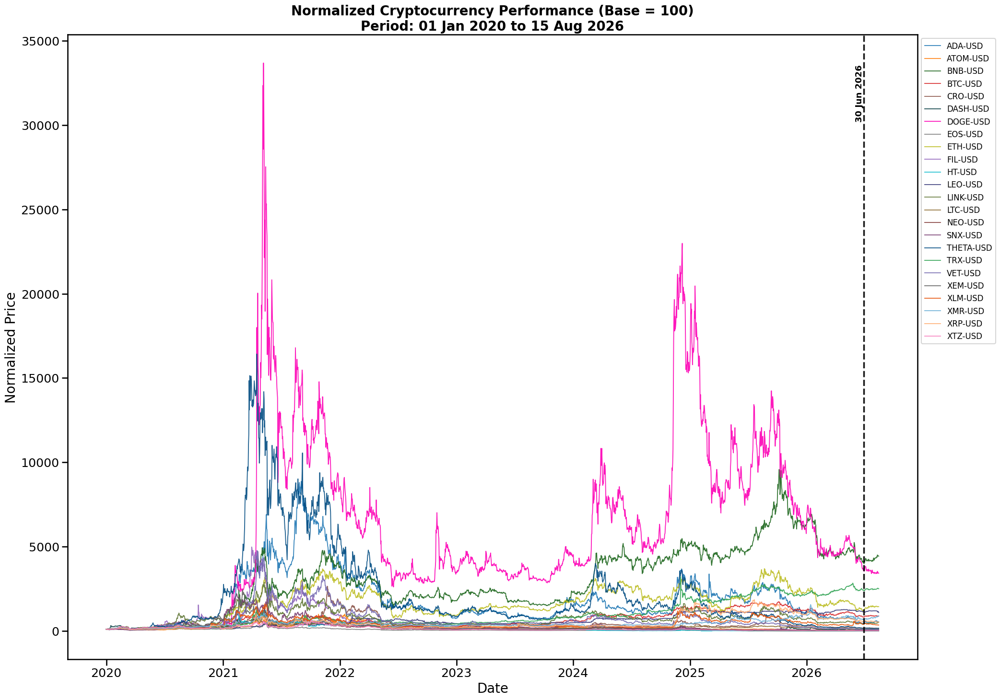

In [14]:
#==============================
# VISUALIZE NORMALIZED DAILY CLOSING PRICE PERFORMANCE
# IN-SAMPLE DATA
#==============================

#Set Plot Style
#==============================

sns.set_context("talk", font_scale=1.1)

#Create Figure
#==============================

plt.figure(figsize=(25,15))

#Loop Through Each Ticker
#==============================

for ticker in master_df["Ticker"].unique():
    
    #Extract one coin's data
    coin = (
        master_df[
            master_df["Ticker"] == ticker
        ]
        .sort_values("Date")
    )

    # Skip Empty Dataframes
    if coin.empty:
        continue

    #Calculate normalized closing price
    normalized_price = (
        coin["Close"]
        / coin["Close"].iloc[0]
    ) * 100

    #Plot each cryptocurrency 
    plt.plot(
        coin["Date"],
        normalized_price,
        color=colors[ticker],
        linewidth=1.3,
        alpha=0.9,   #transparency
        label=ticker
    )

# Boundary Line at 30 June 2026
#==============================

boundary_date = pd.Timestamp("2026-06-30")

plt.axvline(
    x=boundary_date,
    color="black",
    linestyle="--",
    linewidth=2.5,
    alpha=0.9
)

# Boundary Label
plt.text(
    boundary_date,
    plt.ylim()[1] * 0.95,
    "30 Jun 2026",
    rotation=90,
    verticalalignment="top",
    horizontalalignment="right",
    fontsize=13,
    fontweight="bold"
)

# Add Title and Labels
#==============================

# In-sample Date Range
start_date = (
    master_df["Date"]
    .min()
    .strftime("%d %b %Y")
)

end_date = (
    master_df["Date"]
    .max()
    .strftime("%d %b %Y")
)

plt.title(
    "Normalized Cryptocurrency Performance (Base = 100)\n"
    "Period: {} to {}".format(start_date, end_date),
    fontweight="bold"
)
plt.xlabel("Date")
plt.ylabel("Normalized Price")

# Create Legend
#==============================

plt.legend(
    loc="upper left",
    bbox_to_anchor=(1, 1),
    fontsize=12,
    frameon=True
)

# Adjust Layout and Display
#==============================

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()

**Volatility**

In [15]:
#Bui, C. (2021). Bitcoin’s Realized Volatility Forecasting with GARCH and Multivariate LSTM. [online] GitHub. Available at: https://github.com/chibui191/bitcoin_volatility_forecasting/blob/main/Notebooks/Reports/report_notebook.ipynb.

In [16]:
#==============================
# CALCULATE PRICE RETURNS AND LOG RETURNS
#==============================

'''Turn raw prices into return/ log returns to make them stationary 
for time-series modeling later on'''

# Sort Data by Ticker and Date
#==============================

master_df = master_df.sort_values(
    ["Ticker","Date"]
)

# Calculate Simple Returns
#==============================

master_df["Return"] = (
    master_df.groupby("Ticker")["Close"]   #calculate returns separately for each ticker
    .pct_change()
)

# Calculate Log Returns
#==============================

master_df["Log Return"] = (
    master_df.groupby("Ticker")["Close"]
    .transform(                  #transform applies the function to each group and returns a series with the same index as the original dataFrame
        lambda x:
        np.log(x / x.shift(1))   #shift(1) moves prices down one row
    )
)

# Remove Missing Values Created by Return and Log Return Calculations
#==============================

master_df = master_df.dropna(
    subset=["Return","Log Return"]
)

In [17]:
#==============================
# DROP THE FIRST ROW OF DATA
#==============================

''' Because the first row is shifted forward to calculate returns/ log returns'''

master_df.dropna(inplace=True)
print("DATASET:")
print("="*30)
print("Rows and columns:", master_df.shape)

print("\nDataset:\n")

print(master_df.head(10))

DATASET:
Rows and columns: (58032, 9)

Dataset:

         Date     Close      High       Low      Open    Volume   Ticker  \
1  2020-01-02  0.032751  0.033507  0.032448  0.033474  20843934  ADA-USD   
2  2020-01-03  0.034180  0.034427  0.032491  0.032748  30162644  ADA-USD   
3  2020-01-04  0.034595  0.034685  0.033872  0.034191  29535781  ADA-USD   
4  2020-01-05  0.034721  0.035356  0.034545  0.034574  21479178  ADA-USD   
5  2020-01-06  0.037272  0.037299  0.034674  0.034751  37988444  ADA-USD   
6  2020-01-07  0.037047  0.037807  0.036653  0.037291  51562680  ADA-USD   
7  2020-01-08  0.036435  0.038551  0.036015  0.037055  49193345  ADA-USD   
8  2020-01-09  0.036359  0.036445  0.035673  0.036445  26562776  ADA-USD   
9  2020-01-10  0.036874  0.036980  0.034807  0.036335  47483943  ADA-USD   
10 2020-01-11  0.036825  0.037579  0.036522  0.036854  63485488  ADA-USD   

      Return  Log Return  
1  -0.021131   -0.021357  
2   0.043632    0.042707  
3   0.012142    0.012069  
4   0.

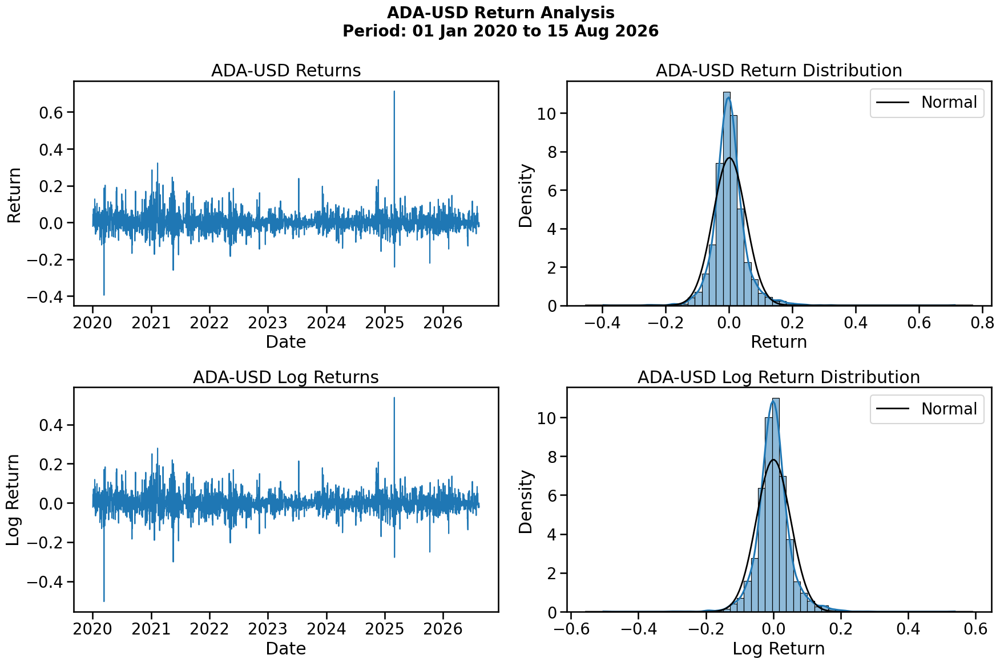

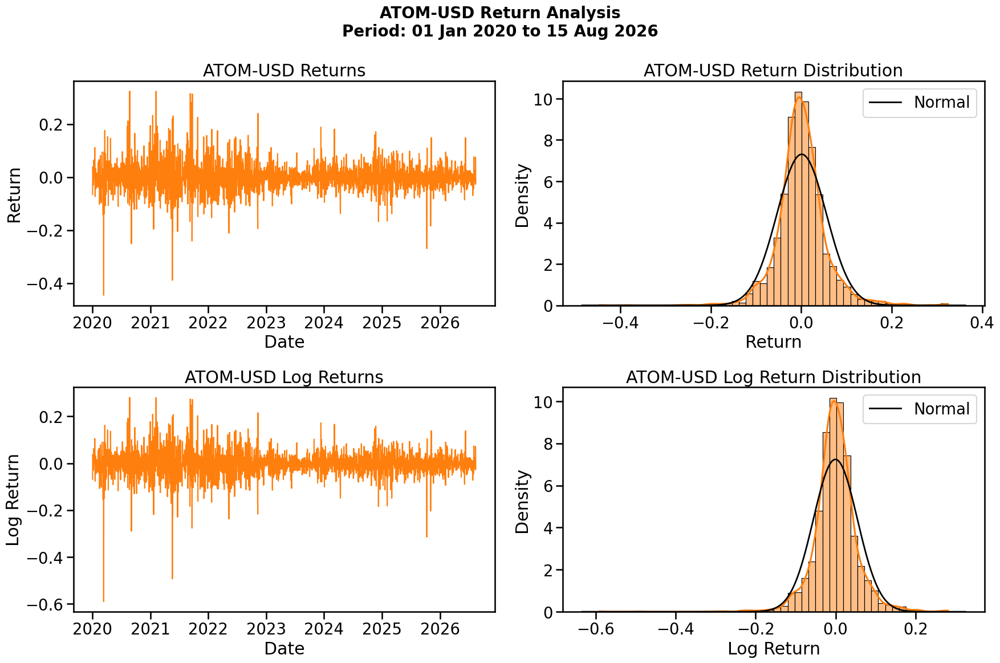

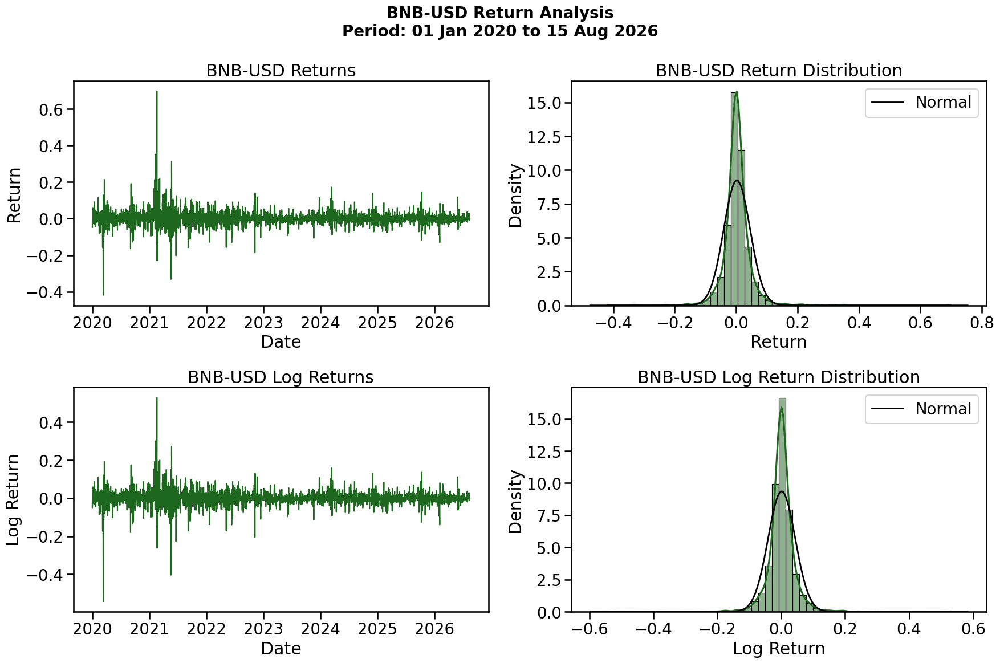

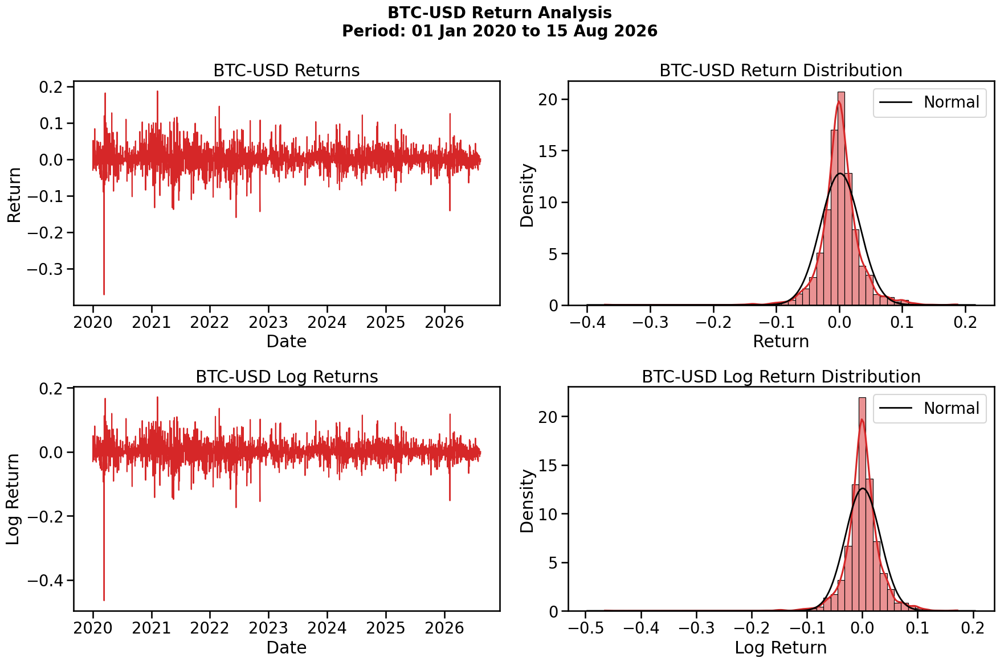

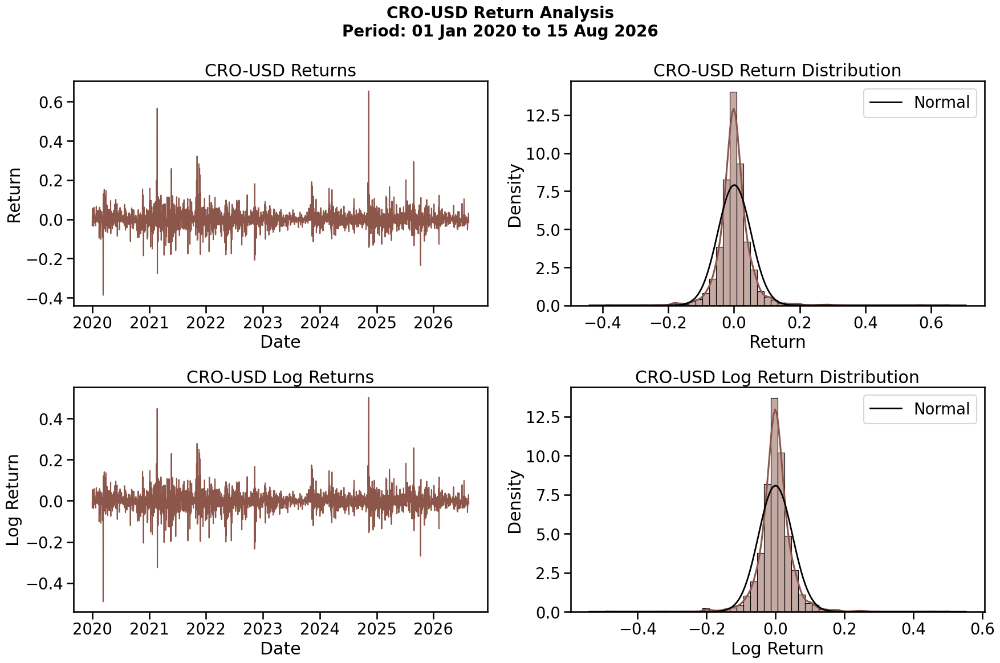

...

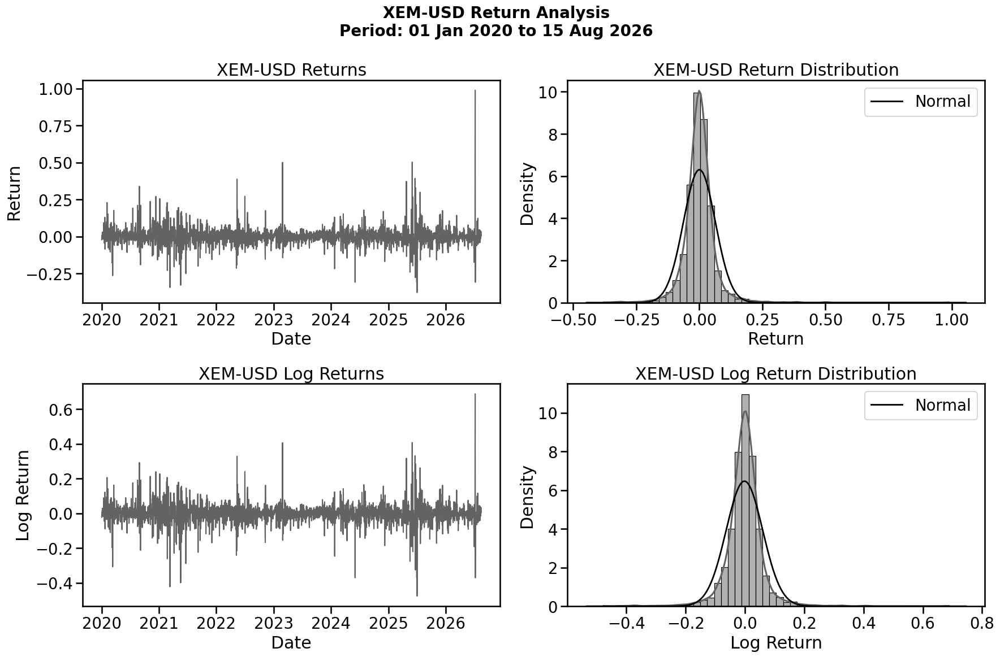

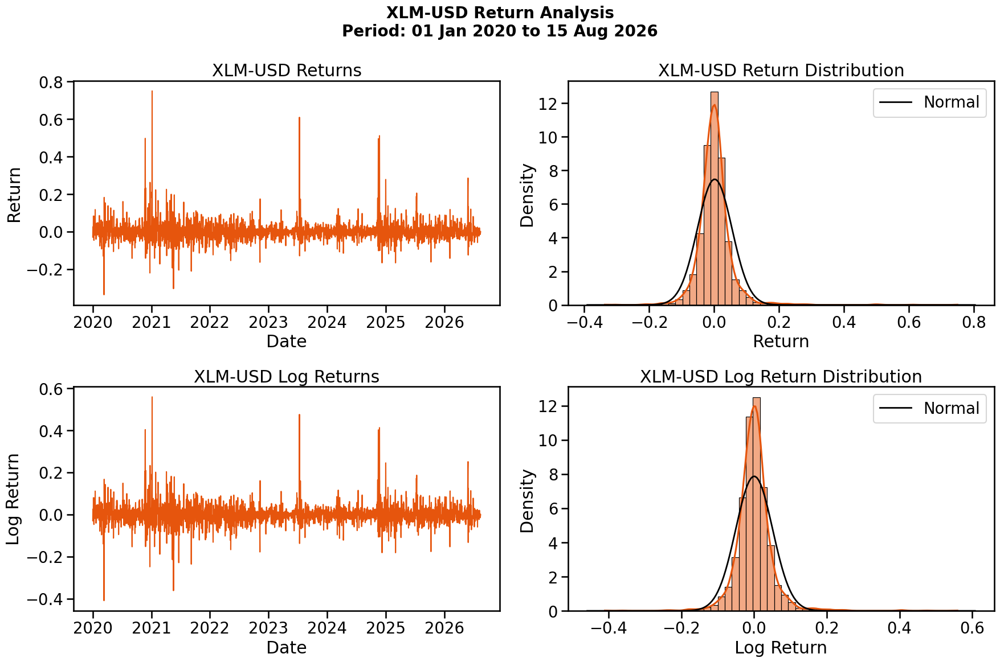

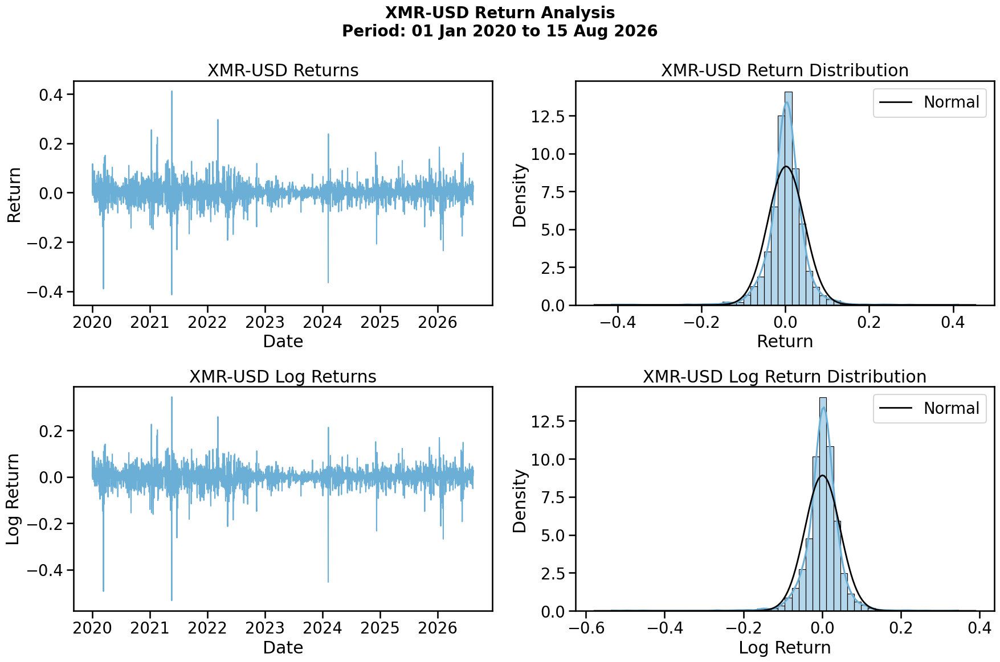

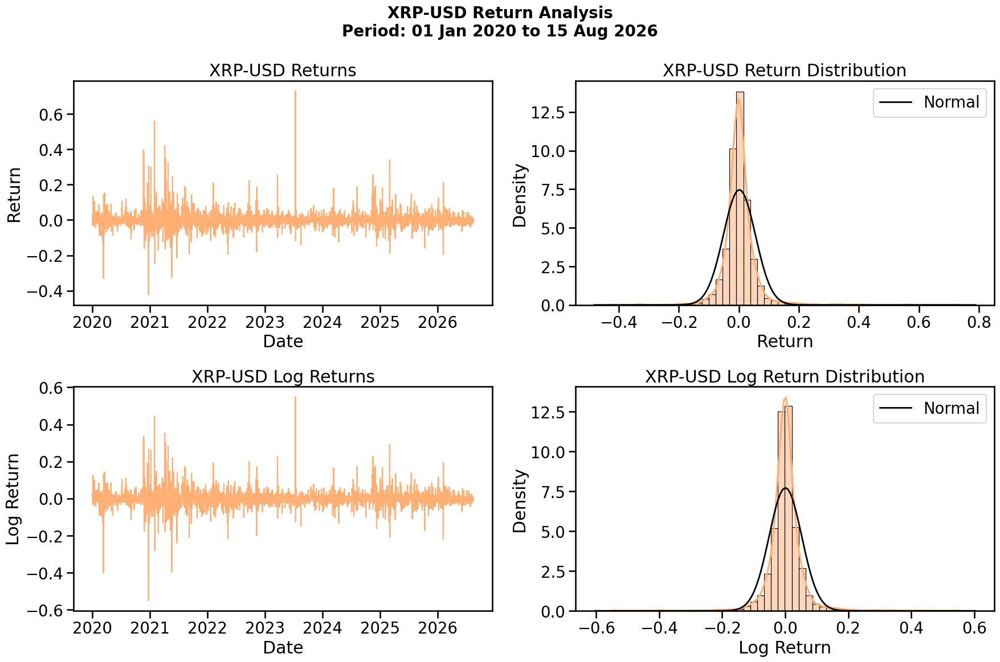

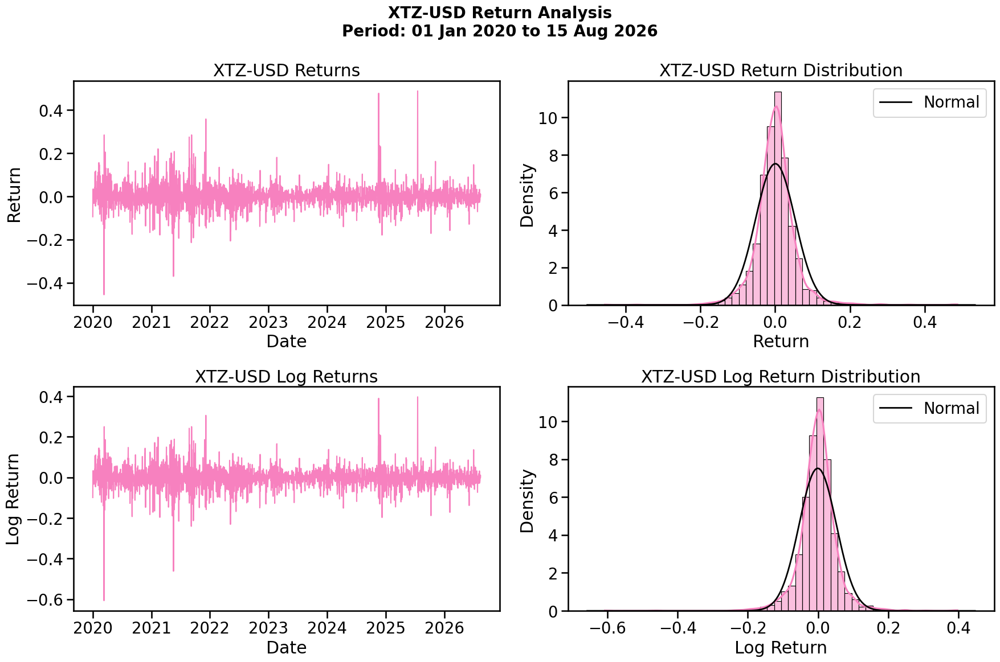

In [18]:
#==============================
# VISUALIZE RETURN AND LOG RETURN DISTRIBUTION
# AND COMPARE WITH STANDARD NORMAL DISTRIBUTION
#==============================

sns.set_context("talk", font_scale=1.2)

for ticker in master_df["Ticker"].unique():

    coin = (
        master_df[
            master_df["Ticker"] == ticker
        ]
        .sort_values("Date")
        .copy()
    )

    color = colors[ticker]

    fig, axes = plt.subplots(
        nrows=2,
        ncols=2,
        figsize=(18,12)
    )

    # Returns Time Series
    # ==========================

    axes[0,0].plot(
        coin["Date"],
        coin["Return"],
        color=color,
        linewidth=1.5
    )

    axes[0,0].set_title(
        f"{ticker} Returns"
    )

    axes[0,0].set_xlabel("Date")
    axes[0,0].set_ylabel("Return")

    # Return Distribution
    # ==========================

    sns.histplot(
        coin["Return"].dropna(),
        stat="density",
        bins=50,
        color=color,
        kde=True,
        ax=axes[0,1]
    )

    xmin, xmax = axes[0,1].get_xlim()

    x = np.linspace(
        xmin,
        xmax,
        200
    )

    mu, sigma = stats.norm.fit(
        coin["Return"].dropna()
    )

    axes[0,1].plot(
        x,
        stats.norm.pdf(
            x,
            mu,
            sigma
        ),
        color="black",
        linewidth=2,
        label="Normal"
    )

    axes[0,1].set_title(
        f"{ticker} Return Distribution"
    )

    axes[0,1].legend()

    # Log Returns Time Series
    # ==========================

    axes[1,0].plot(
        coin["Date"],
        coin["Log Return"],
        color=color,
        linewidth=1.5
    )

    axes[1,0].set_title(
        f"{ticker} Log Returns"
    )

    axes[1,0].set_xlabel("Date")
    axes[1,0].set_ylabel("Log Return")

    # Log Return Distribution
    # ==========================

    sns.histplot(
        coin["Log Return"].dropna(),
        stat="density",
        bins=50,
        color=color,
        kde=True,
        ax=axes[1,1]
    )

    xmin, xmax = axes[1,1].get_xlim()

    x = np.linspace(
        xmin,
        xmax,
        200
    )

    mu, sigma = stats.norm.fit(
        coin["Log Return"].dropna()
    )

    axes[1,1].plot(
        x,
        stats.norm.pdf(
            x,
            mu,
            sigma
        ),
        color="black",
        linewidth=2,
        label="Normal"
    )

    axes[1,1].set_title(
        f"{ticker} Log Return Distribution"
    )

    axes[1,1].legend()

    plt.suptitle(
        f"{ticker} Return Analysis\nPeriod: {start_date} to {end_date}",
        fontsize=20,
        fontweight="bold"
    )

    plt.tight_layout()

    plt.show()

-> Across all 23 cryptocurrencies, the return and log-return series exhibit the key stylized facts of financial time series, including volatility clustering, near-zero mean returns, and time-varying variance. The return distributions are consistently more peaked and possess heavier tails than the fitted normal distribution, indicating excess kurtosis and frequent extreme price movements. While log returns improve symmetry and reduce the influence of large price changes, they remain non-Gaussian. 

In [19]:
#==============================
# DESCRIBE RETURN
#==============================

print("RETURN DESCRIPTIVE STATISTICS:")
print("="*30)
master_df.Return.describe()

RETURN DESCRIPTIVE STATISTICS:


count     58032.000000
mean          5.131399
std        1103.630519
min          -0.999996
25%          -0.021559
50%           0.000386
75%           0.021685
max      263682.498571
Name: Return, dtype: float64

In [20]:
#==============================
# DESCRIBE LOG RETURN
#==============================
print("LOG RETURN DESCRIPTIVE STATISTICS:")
print("="*30)
master_df["Log Return"].describe()

LOG RETURN DESCRIPTIVE STATISTICS:


count    58032.000000
mean         0.000121
std          0.113638
min        -12.482505
25%         -0.021795
50%          0.000386
75%          0.021453
max         12.482505
Name: Log Return, dtype: float64

**Realized Volatility**

In [21]:
#====================================================
# REALIZED VOLATILITY FUNCTION
#====================================================

def realized_volatility(log_returns):
    """
    Calculate realized volatility.

    RV = sqrt(sum(r²)/(n-1))
    """
    n = len(log_returns)

    if n < 2:
        return np.nan

    return np.sqrt(
        np.sum(log_returns ** 2) / (n - 1)
    )

In [22]:
#====================================================
# CALCULATE REALIZED VOLATILITY OVER DIFFERENT ROLLING WINDOWS
# IN-SAMPLE DATA
#====================================================

'''
Calculate realized volatility over multiple rolling windows
including 1 week, 1 month, 2 months, 6 months, and 1 year.
'''

windows = [7, 30, 60, 180, 365]

for window in windows:

    master_df[f"RV_{window}"] = (

        master_df

        .groupby("Ticker")["Log Return"]

        .rolling(window)

        .apply(
            realized_volatility,
            raw=True
        )

        .reset_index(level=0, drop=True)

    )

In [23]:
#====================================================
# SUMMARY TABLE OF REALIZED VOLATILITY
# IN-SAMPLE DATA
#====================================================

summary_RV_table = (

    master_df[
        [
            "RV_7",
            "RV_30",
            "RV_60",
            "RV_180",
            "RV_365"
        ]
    ]

    .describe()

    .T

)

summary_RV_table = summary_RV_table.rename(

    columns={

        "count":"Count",

        "mean":"Mean",

        "std":"Std Dev",

        "min":"Minimum",

        "25%":"Q1",

        "50%":"Median",

        "75%":"Q3",

        "max":"Maximum"

    }

)

summary_RV_table = summary_RV_table.round(4)
print("REALIZED VOLATILITY SUMMARY TABLE")
print("="*30)
print(summary_RV_table)

REALIZED VOLATILITY SUMMARY TABLE
          Count    Mean  Std Dev  Minimum      Q1  Median      Q3  Maximum
RV_7    57888.0  0.0492   0.1125   0.0010  0.0248  0.0376  0.0562   7.3452
RV_30   57336.0  0.0511   0.1042   0.0029  0.0290  0.0410  0.0572   3.9468
RV_60   56616.0  0.0528   0.1029   0.0039  0.0314  0.0430  0.0585   3.0826
RV_180  53736.0  0.0560   0.1026   0.0105  0.0357  0.0465  0.0582   1.7800
RV_365  49296.0  0.0594   0.1046   0.0133  0.0384  0.0474  0.0588   1.2510


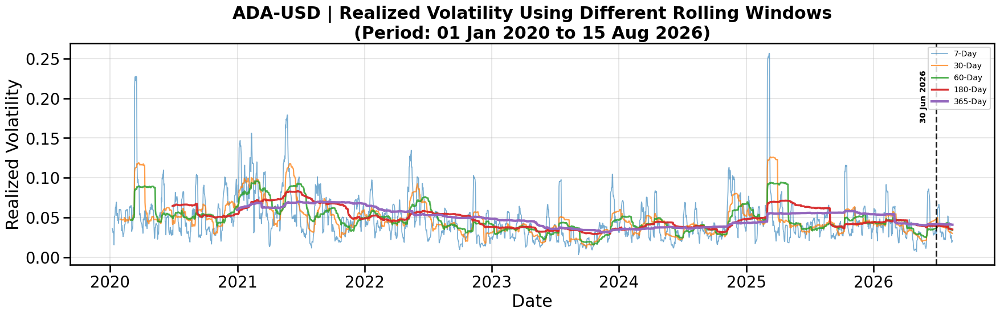

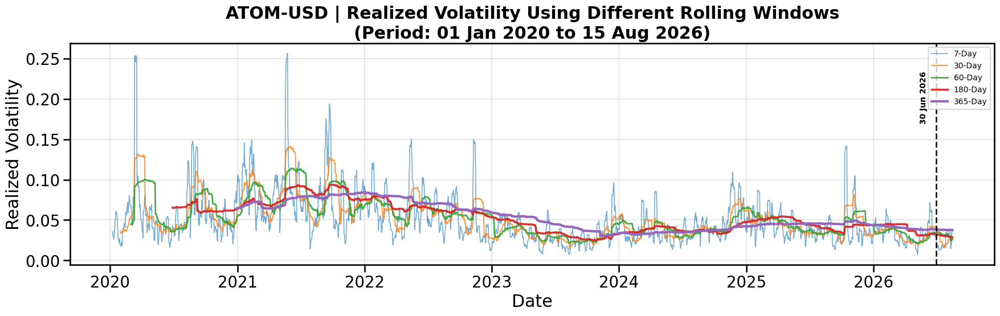

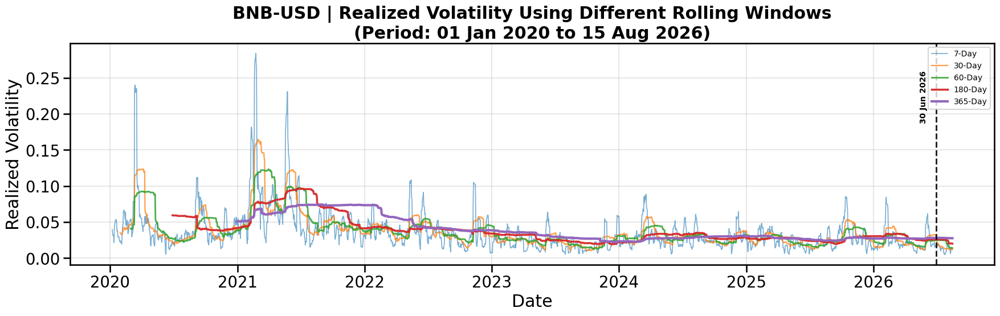

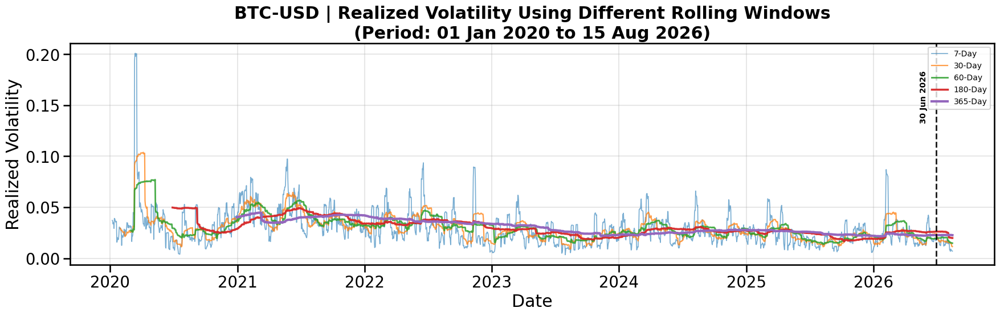

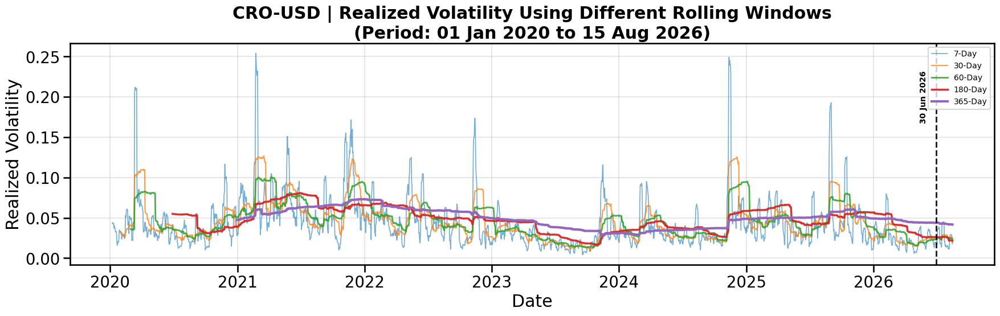

...

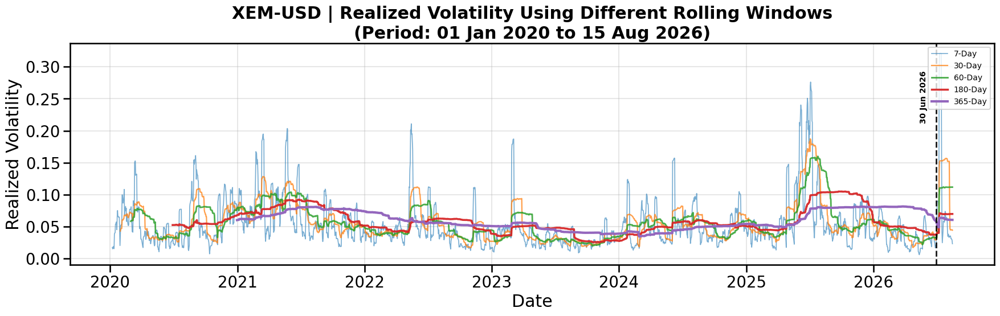

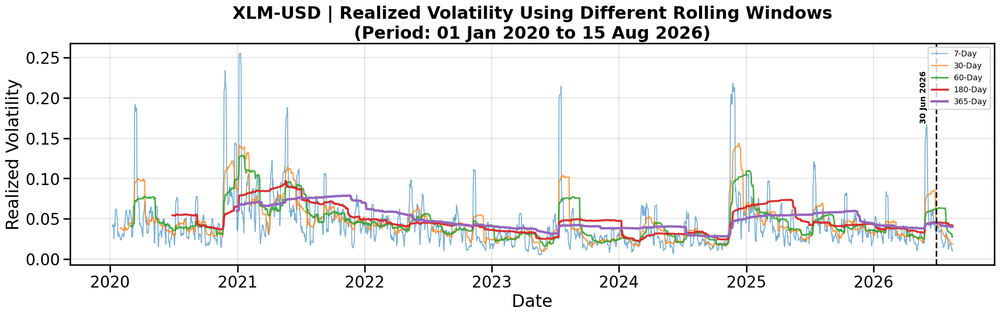

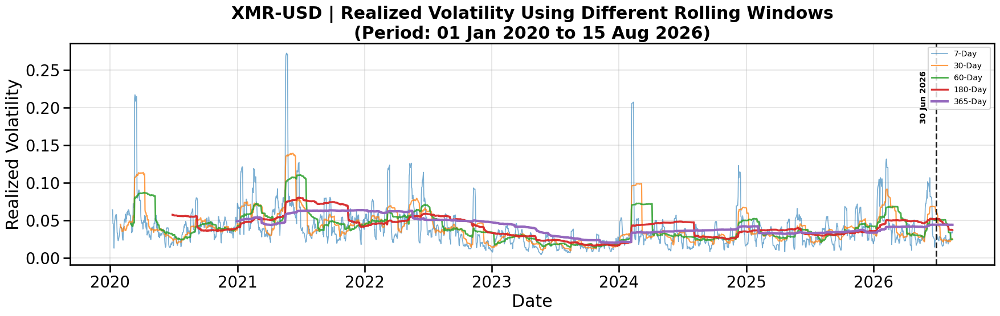

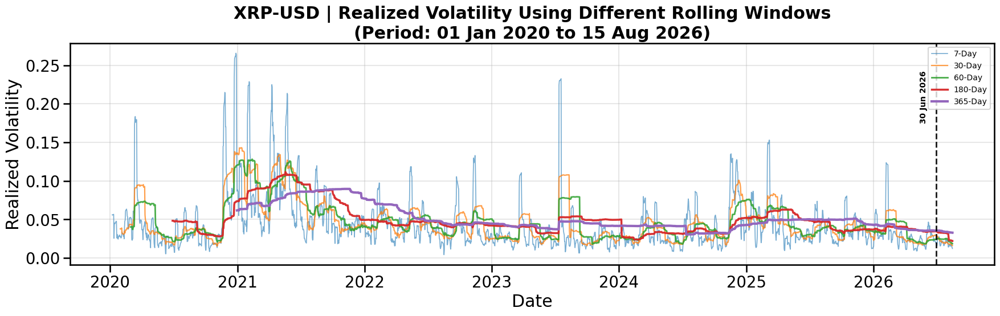

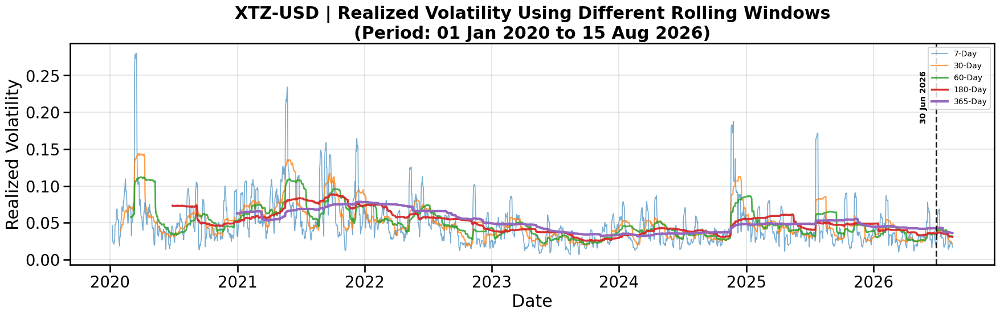

In [24]:
#====================================================
# COMPARE DIFFERENT REALIZED VOLATILITY WINDOWS
# FOR EACH CRYPTOCURRENCY
#====================================================

sns.set_context(
    "talk",
    font_scale=1.2
)

windows = [7, 30, 60, 180, 365]

# Boundary Date
#====================================================

boundary_date = pd.Timestamp("2026-06-30")

for ticker in sorted(master_df["Ticker"].unique()):

    coin = (
        master_df[
            master_df["Ticker"] == ticker
        ]
        .sort_values("Date")
    )

    plt.figure(figsize=(18,6))

    # Plot Realized Volatility Windows
    #====================================================

    for window in windows:

        if window == 7:
            lw = 1.2
            alpha = 0.60

        elif window == 30:
            lw = 1.6
            alpha = 0.75

        elif window == 60:
            lw = 2.0
            alpha = 0.85

        elif window == 180:
            lw = 2.5
            alpha = 0.95

        else:   # 365 days
            lw = 3.0
            alpha = 1.00

        plt.plot(
            coin["Date"],
            coin[f"RV_{window}"],
            linewidth=lw,
            alpha=alpha,
            label=f"{window}-Day"
        )

    # Boundary Line at 30 June 2026
    #====================================================

    plt.axvline(
        x=boundary_date,
        color="black",
        linestyle="--",
        linewidth=2.0,
        alpha=0.9
    )

    # Boundary Label
    #====================================================

    plt.text(
        boundary_date - pd.Timedelta(days=25),  
        plt.ylim()[1] * 0.75,                  
        "30 Jun 2026",
        rotation=90,
        verticalalignment="center",
        horizontalalignment="right",
        fontsize=10,
        fontweight="bold"
    )

    # Title and Labels
    #====================================================

    plt.title(
        f"{ticker} | Realized Volatility Using Different Rolling Windows\n"
        "(Period: {} to {})".format(start_date, end_date),
        fontweight="bold"
    )

    plt.xlabel("Date")

    plt.ylabel("Realized Volatility")

    # Legend
    #====================================================

    plt.legend(
        loc="upper right",
        fontsize=10
    )

    # Grid
    #====================================================

    plt.grid(
        alpha=0.3
    )

    # Display
    #====================================================

    plt.tight_layout()

    plt.show()

-> Using 30 day interval window to smooth the volatility down and avoid wasting too many datapoints

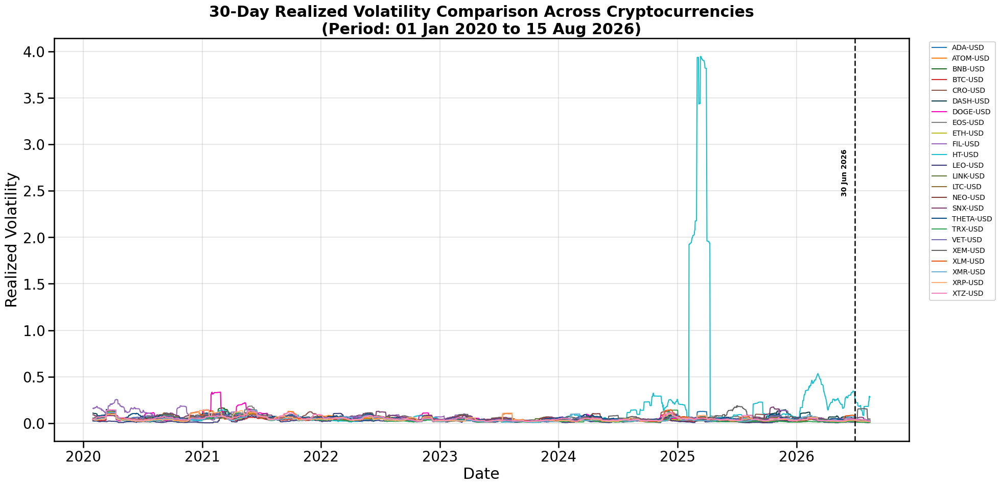

In [25]:
#====================================================
# COMPARE 30-DAY REALIZED VOLATILITY
#====================================================

plt.figure(figsize=(20,10))

for ticker in sorted(master_df["Ticker"].unique()):

    coin = (
        master_df[
            master_df["Ticker"] == ticker
        ]
        .sort_values("Date")
    )

    plt.plot(

        coin["Date"],

        coin["RV_30"],

        color=colors[ticker],

        linewidth=1.5,

        label=ticker

    )

# Boundary Line at 30 June 2026
#====================================================

boundary_date = pd.Timestamp("2026-06-30")

plt.axvline(
    x=boundary_date,
    color="black",
    linestyle="--",
    linewidth=2.0,
    alpha=0.9
)

# Boundary Label
#====================================================

plt.text(
    boundary_date - pd.Timedelta(days=20),
    plt.ylim()[1] * 0.65,
    "30 Jun 2026",
    rotation=90,
    verticalalignment="center",
    horizontalalignment="right",
    fontsize=10,
    fontweight="bold"
)

# Title and Labels
#====================================================

plt.title(
    "30-Day Realized Volatility Comparison Across Cryptocurrencies\n"
    "(Period: {} to {})".format(start_date, end_date),
    fontweight="bold"
)

plt.xlabel("Date")

plt.ylabel("Realized Volatility")

# Legend
#====================================================

plt.legend(
    loc="upper left",
    bbox_to_anchor=(1.02,1),
    fontsize=10
)

# Grid
#====================================================

plt.grid(alpha=0.3)

# Adjust Layout
#====================================================

plt.tight_layout(rect=[0,0,1,1])

plt.show()

# Baseline - GARCH (1,1) Model: Capture Volatility Clustering

In [26]:
#====================================================
# IMPORT LIBRARIES NEEDED FOR GARCH MODELING
#====================================================

from statsmodels.tsa.stattools import adfuller   #Augmented Dickey-Fuller test for stationary
from statsmodels.stats.diagnostic import het_arch   #ARCH Lagrange Multiplier (LM) test for conditional heteroskedasticity

from statsmodels.graphics.tsaplots import (   #Plotting functions for autocorrelation and partial autocorrelation
    plot_acf,
    plot_pacf
)

from arch import arch_model   # ARCH Model

In [27]:
# ==========================================================
# GARCH SAMPLE PERIOD
# ==========================================================

# GARCH Sample Period
#==============================


garch_sample_df = (
    master_df
    .copy()
)

# Sort Data
#==============================

garch_sample_df = (
    garch_sample_df
    .sort_values(["Ticker", "Date"])
    .reset_index(drop=True)
)

# Create 7 Step Ahead Target
#==============================

garch_sample_df["RV_30_Target"] = (

    garch_sample_df

    .groupby("Ticker")["RV_30"]

    .shift(-7)

)

# Remove Missing Targets
#==============================

garch_sample_df = garch_sample_df.dropna(
    subset=["RV_30", "RV_30_Target"]
)

# Check Dataset
#=============================

print("=" * 30)
print("GARCH SAMPLE SUMMARY")
print("=" * 30)

print(f"Shape: {garch_sample_df.shape}")
print(f"Tickers: {garch_sample_df['Ticker'].nunique()}")

print("\nDate Range:")
print(garch_sample_df["Date"].min())
print(garch_sample_df["Date"].max())

print("\nColumns:")
print(garch_sample_df.columns.tolist())

print("\nFirst 5 rows:")
print(garch_sample_df.head())

GARCH SAMPLE SUMMARY
Shape: (57168, 15)
Tickers: 24

Date Range:
2020-01-31 00:00:00
2026-08-08 00:00:00

Columns:
['Date', 'Close', 'High', 'Low', 'Open', 'Volume', 'Ticker', 'Return', 'Log Return', 'RV_7', 'RV_30', 'RV_60', 'RV_180', 'RV_365', 'RV_30_Target']

First 5 rows:
         Date     Close      High       Low      Open     Volume   Ticker  \
29 2020-01-31  0.053793  0.056567  0.052270  0.056034  130754832  ADA-USD   
30 2020-02-01  0.056092  0.057148  0.053281  0.053836  110646744  ADA-USD   
31 2020-02-02  0.055768  0.058450  0.054925  0.056110  161454527  ADA-USD   
32 2020-02-03  0.056979  0.057712  0.055380  0.055724  106658349  ADA-USD   
33 2020-02-04  0.055996  0.057663  0.054237  0.056966  108933031  ADA-USD   

      Return  Log Return      RV_7     RV_30  RV_60  RV_180  RV_365  \
29 -0.040610   -0.041458  0.059714  0.047512    NaN     NaN     NaN   
30  0.042738    0.041850  0.059947  0.047980    NaN     NaN     NaN   
31 -0.005776   -0.005793  0.058699  0.047332   

**Return/ Log Return Stationary Test**

*Hypotheses*

H0:Series has a unit root (non-stationary)
H1:Series is stationary

-> A p-value < 0.05 indicates rejection of the null hypothesis, suggesting the series is stationary.

In [28]:
#=============================
# ADF TEST FOR STATIONARITY
#=============================

# Create An Empty List
results = []

# Loop through every cryptocurrency
#=============================

for ticker in sorted(garch_sample_df["Ticker"].unique()):
    # Extract one cryptocurrency's log returns
    returns = (
        garch_sample_df[
            garch_sample_df["Ticker"] == ticker
        ]["Log Return"]
        .dropna()
    )
    
    # Perform Augmented Dickey-Fuller test
    adf = adfuller(returns)
    
    # Extract important results
    results.append({
        "Ticker": ticker,
        "ADF Statistic": adf[0],
        "p-value": adf[1]
    })

# Convert to a dataframe
#=============================

adf_results = pd.DataFrame(results)

# Display the results
#=============================

print("ADF TEST FOR STATIONARITY RESULTS:")
print("="*30)
print(adf_results)

ADF TEST FOR STATIONARITY RESULTS:
       Ticker  ADF Statistic       p-value
0     ADA-USD     -33.769283  0.000000e+00
1    ATOM-USD     -12.716740  1.002718e-23
2     BNB-USD      -9.247594  1.522548e-15
3     BTC-USD     -15.942659  7.510043e-29
4     CRO-USD     -22.250738  0.000000e+00
5    DASH-USD     -19.749843  0.000000e+00
6    DOGE-USD      -7.990225  2.485923e-12
7     EOS-USD     -17.135176  7.105780e-30
8     ETH-USD     -12.963979  3.181874e-24
9     FIL-USD     -12.954870  3.317268e-24
10     HT-USD      -8.316480  3.669124e-13
11    LEO-USD     -10.963597  8.208758e-20
12   LINK-USD     -22.399400  0.000000e+00
13    LTC-USD     -18.633995  2.056520e-30
14    NEO-USD     -52.390514  0.000000e+00
15    SNX-USD     -23.183289  0.000000e+00
16  THETA-USD     -18.739968  2.029321e-30
17    TRX-USD     -13.175811  1.224030e-24
18    VET-USD     -20.962157  0.000000e+00
19    XEM-USD     -15.071374  8.714965e-28
20    XLM-USD     -16.861378  1.098992e-29
21    XMR-USD     -

-> Since all 23 cryptocurrencies have extremely negative ADF statistics and p-values far below 0.05, every return series rejects the null hypothesis of a unit root. This indicates that the return and log-return series are stationary, satisfying one of the key assumptions for GARCH modeling.

In [29]:
#====================================================
# LM TEST FOR CONDITIONAL HETEROSKEDASTICITY
#====================================================

# Create an empty list
results = []

# Loop through every cryptocurrency
#=============================

for ticker in sorted(garch_sample_df["Ticker"].unique()):

    returns = (
        garch_sample_df[
            garch_sample_df["Ticker"] == ticker
        ]["Log Return"]
        .dropna()
    )
    
    # Perform Lagrange Multiplier (LM) test for conditional heteroskedasticity
    lm = het_arch(
        returns,
        nlags=14
    )

    results.append({

        "Ticker": ticker,

        "LM Statistic": lm[0],

        "p-value": lm[1]

    })

arch_results = pd.DataFrame(results)

print("LM TEST FOR CONDITIONAL HETEROSKEDASTICITY RESULTS:")
print("="*30)
print(arch_results)

LM TEST FOR CONDITIONAL HETEROSKEDASTICITY RESULTS:
       Ticker  LM Statistic       p-value
0     ADA-USD    109.608996  6.661688e-17
1    ATOM-USD     99.871703  5.018658e-15
2     BNB-USD    219.165882  6.517414e-39
3     BTC-USD     56.111428  5.572437e-07
4     CRO-USD    161.105184  4.253629e-27
5    DASH-USD    141.948841  2.905640e-23
6    DOGE-USD     56.718377  4.376656e-07
7     EOS-USD    214.639823  5.534022e-38
8     ETH-USD     80.206133  2.591078e-11
9     FIL-USD    167.548479  2.140406e-28
10     HT-USD    498.651302  1.790813e-97
11    LEO-USD    120.174792  5.815339e-19
12   LINK-USD    110.191258  5.136689e-17
13    LTC-USD    123.018735  1.610268e-19
14    NEO-USD    102.412384  1.632849e-15
15    SNX-USD    126.867484  2.818759e-20
16  THETA-USD     67.095335  6.449052e-09
17    TRX-USD     61.142653  7.388536e-08
18    VET-USD    103.793992  8.853621e-16
19    XEM-USD    140.722372  5.096738e-23
20    XLM-USD    120.722266  4.542832e-19
21    XMR-USD    117.563

Since all p-values are far below 0.05, the null hypothesis is rejected for every cryptocurrency, indicating significant ARCH effects. This confirms that volatility clustering is present and that GARCH models are appropriate.

**Volatility Clustering Test**

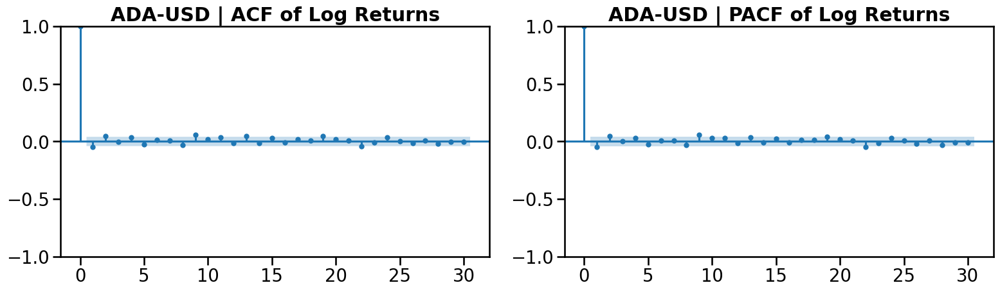

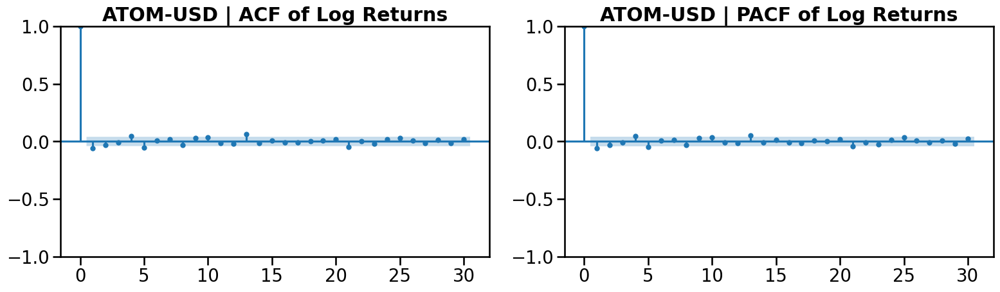

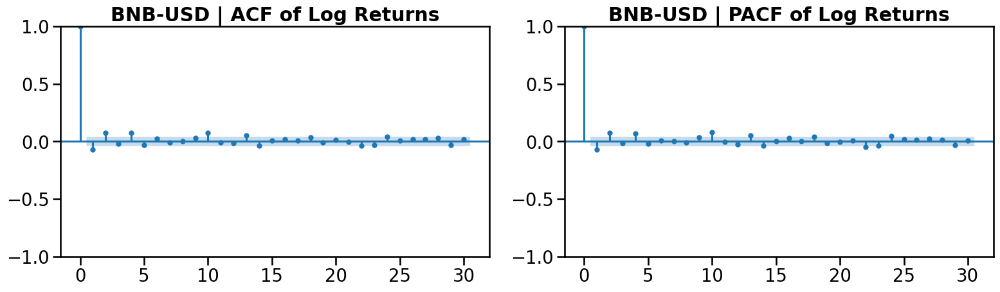

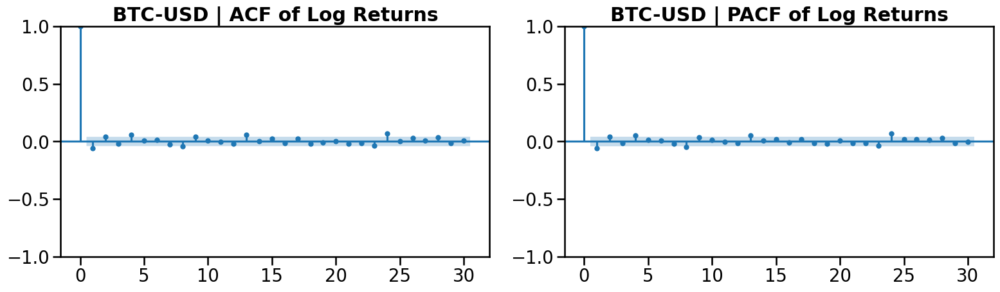

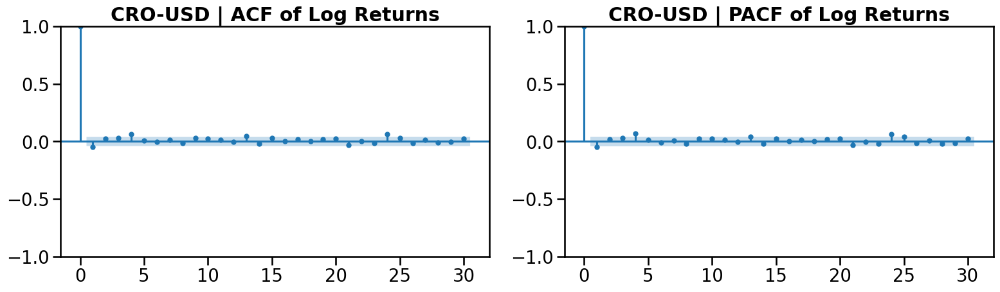

...

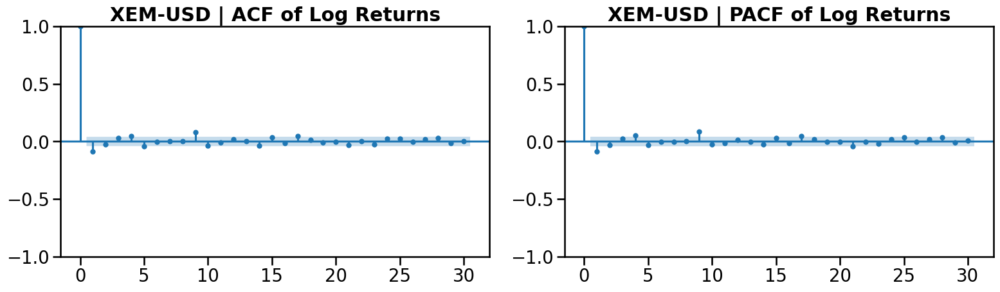

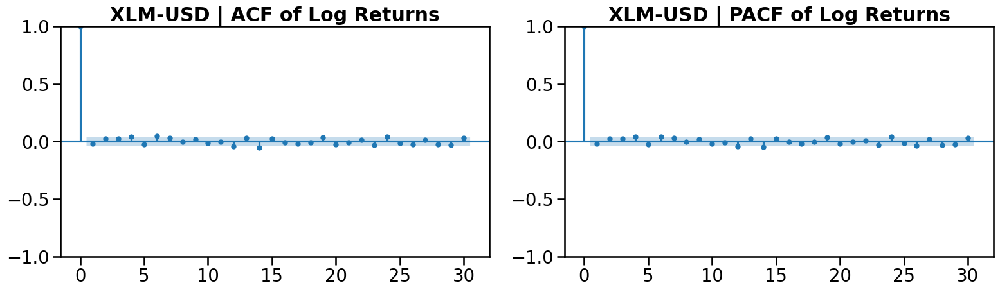

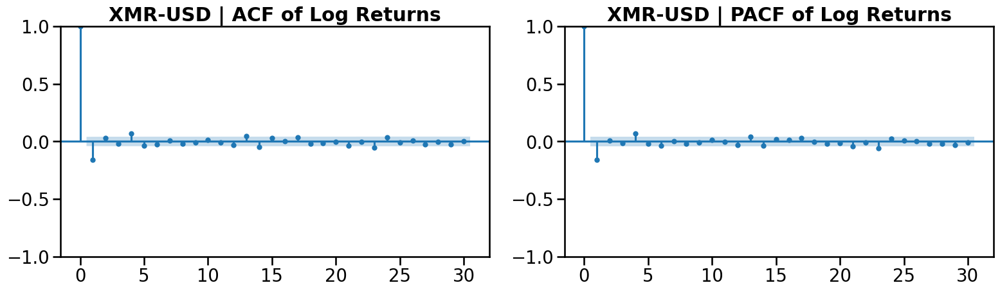

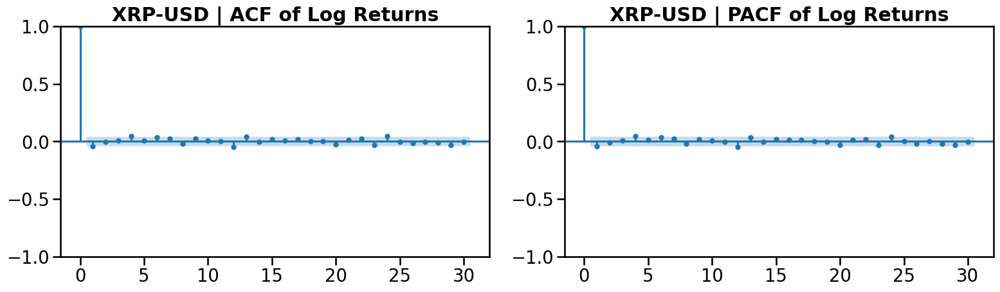

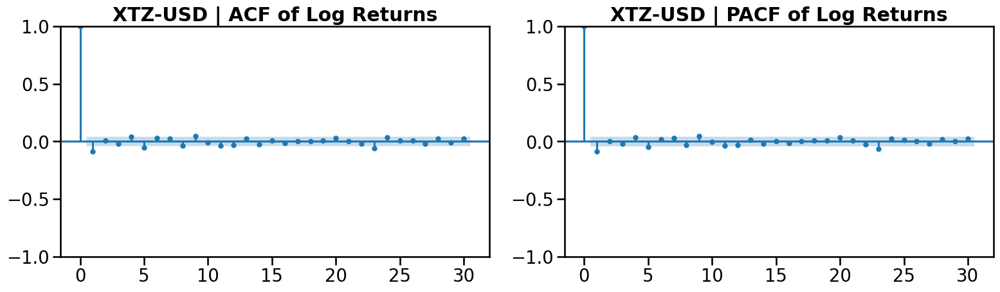

In [30]:
# ============================================
# ACF AND PACF OF LOG RETURNS
# ============================================

# Loop through every cryptocurrency
#=============================

for ticker in garch_sample_df["Ticker"].unique():

    coin = (
        garch_sample_df[
            garch_sample_df["Ticker"] == ticker
        ]
        .copy()
    )

    returns = (
        coin["Log Return"]
        .dropna()
    )

    # Create figure
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(16,5)
    )

    # Plot ACF and PACF
    plot_acf(
        returns,
        lags=30,
        ax=axes[0]
    )

    axes[0].set_title(
        f"{ticker} | ACF of Log Returns",
        fontweight="bold"
    )

    plot_pacf(
        returns,
        lags=30,
        ax=axes[1],
        method="ywm"   #Yule-Walker method for PACF estimation
    )

    axes[1].set_title(
        f"{ticker} | PACF of Log Returns",
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()

-> The log return series exhibit little to no significant serial correlation across the first 30 lags.

Overall, the ACF results imply that daily cryptocurrency log returns behave approximately as a white-noise process, where current returns are largely independent of past returns. This suggests that historical log returns have limited predictive power for forecasting future returns, and the conditional mean process can be adequately modeled using a simple constant or zero-mean specification. The absence of significant autocorrelation also indicates that subsequent modeling efforts should focus on capturing time-varying volatility rather than serial dependence in returns.

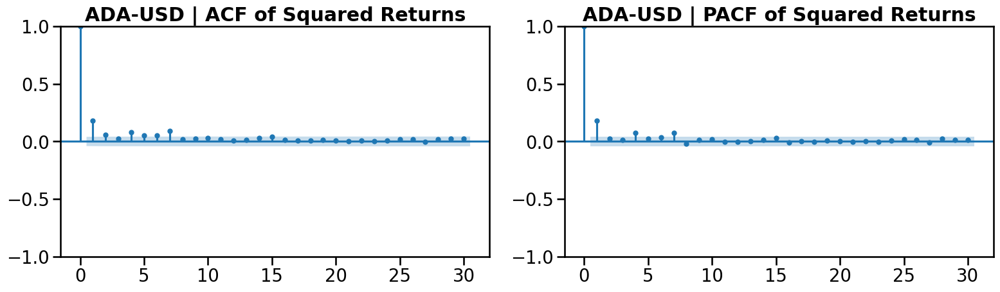

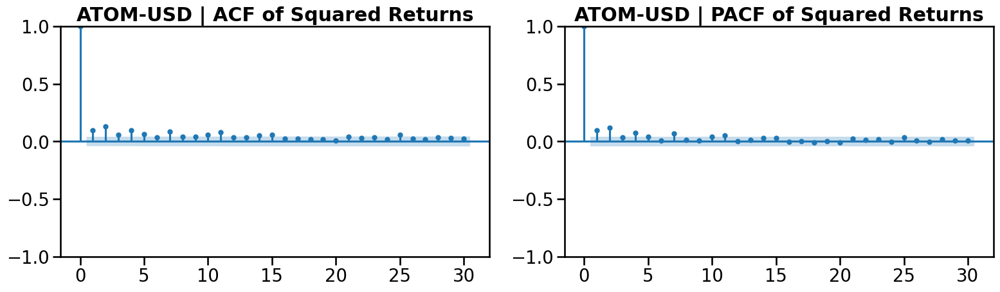

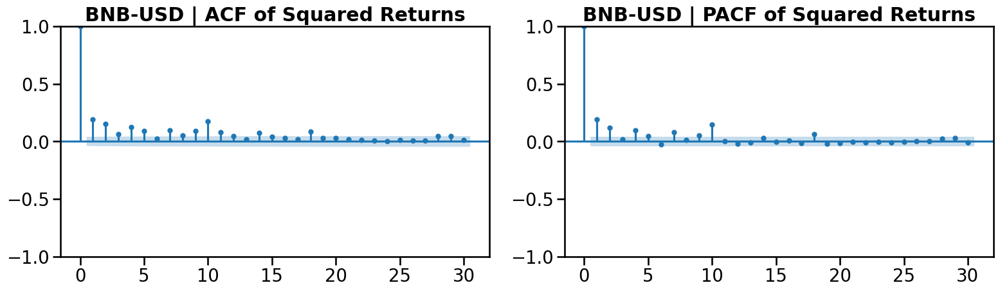

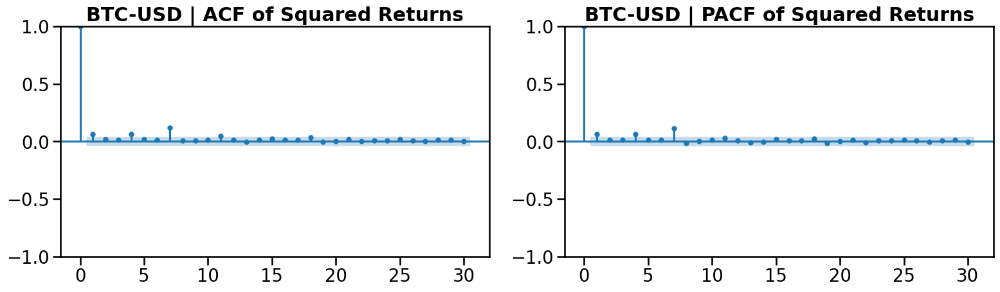

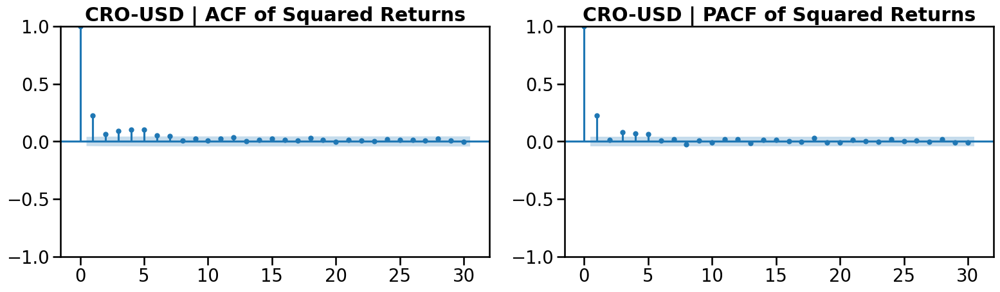

...

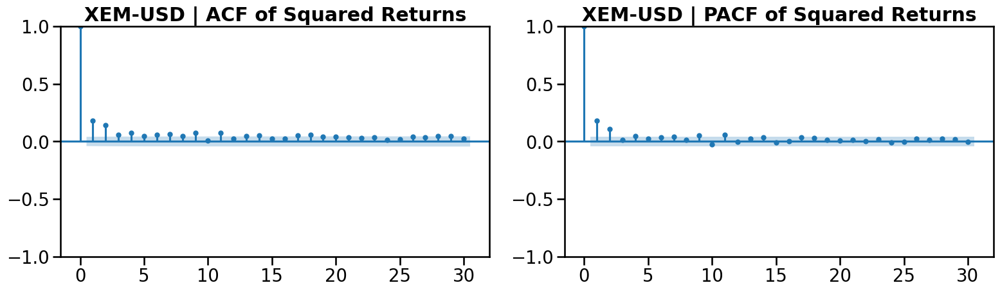

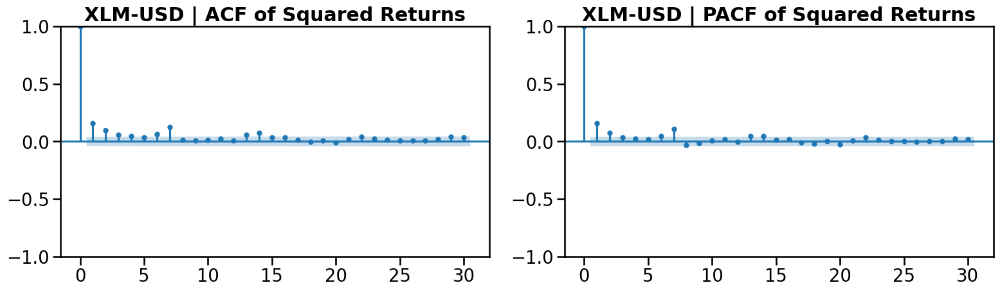

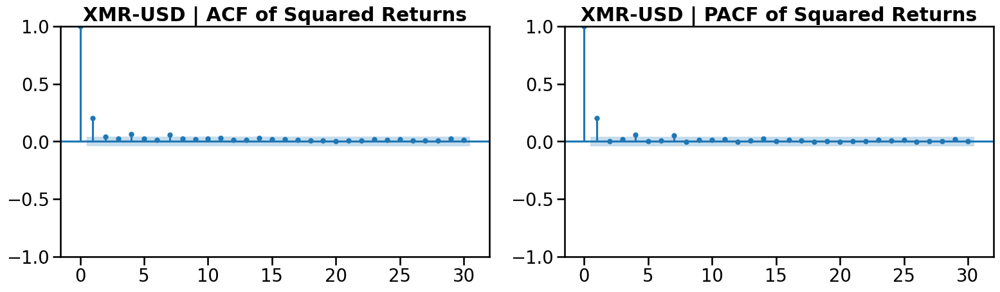

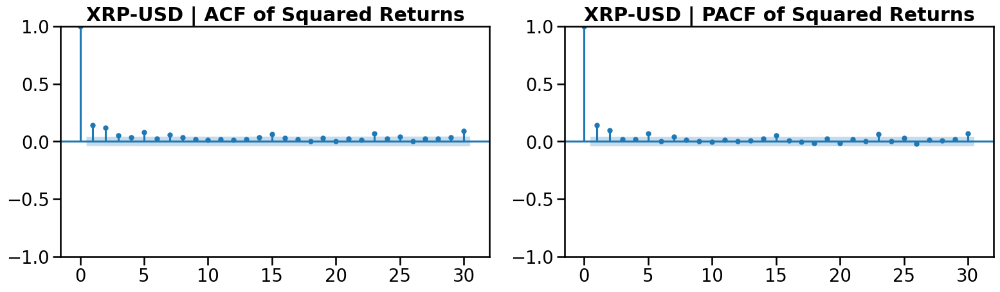

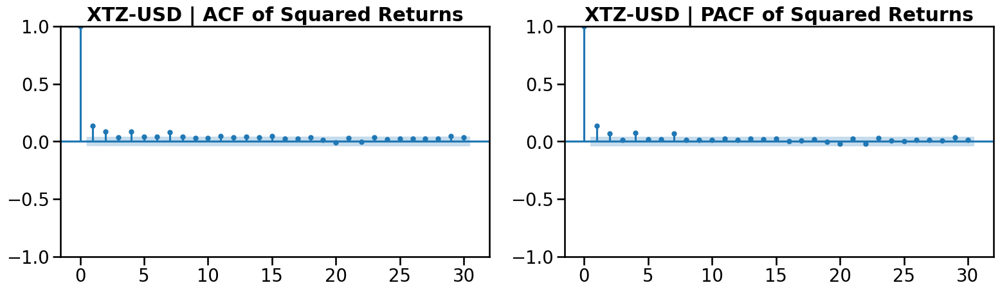

In [31]:
# ============================================
# ACF AND PACF OF SQUARED RETURNS
# ============================================

# Loop through every cryptocurrency
#=============================

for ticker in garch_sample_df["Ticker"].unique():

    coin = (
        garch_sample_df[
            garch_sample_df["Ticker"] == ticker
        ]
        .copy()
    )
    
    # Calculate squared returns
    squared_returns = (

        coin["Log Return"]
        .dropna()

        ** 2
    )
    
    # Create figure
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(16,5)
    )

    plot_acf(
        squared_returns,
        lags=30,
        ax=axes[0]
    )

    axes[0].set_title(
        f"{ticker} | ACF of Squared Returns",
        fontweight="bold"
    )

    plot_pacf(
        squared_returns,
        lags=30,
        ax=axes[1],
        method="ywm"
    )

    axes[1].set_title(
        f"{ticker} | PACF of Squared Returns",
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()

In [32]:
# =============================
# STUDENT-t GARCH(1,1) WITH MULTIPLE ESTIMATION WINDOWS
# =============================

# Define Rolling Estimation Windows
# =============================

windows = [23, 83, 173, 263, 358]

# Store Results
#=============================

garch_forecast_results = {}

garch_evaluation_results = []


# Loop Through Each Rolling Window
#=============================

for window in windows:

    print("\n" + "=" * 30)
    print(f"Rolling GARCH(1,1) - Window = {window}")
    print("=" * 30)

    forecast_list = []

    # Loop through each cryptocurrency

    for ticker in sorted(garch_sample_df["Ticker"].unique()):

        print(f"\nProcessing {ticker}")

        coin = (

            garch_sample_df[
                garch_sample_df["Ticker"] == ticker
            ]

            .sort_values("Date")

            .reset_index(drop=True)

            .copy()

        )

        # Returns

        returns = coin["Log Return"] * 100

        pred_vol = np.full(
            len(coin),
            np.nan
        )

        # Rolling GARCH

        for i in tqdm(

            range(window, len(coin)),

            desc=ticker

        ):

            train = returns.iloc[
                i-window:i
            ]

            try:

                model = arch_model(

                    train,

                    mean="Zero",

                    vol="GARCH",

                    p=1,

                    q=1,

                    dist="t"

                )

                result = model.fit(

                    disp="off",

                    options={
                        "maxiter":500
                    }

                )

                forecast = result.forecast(
                    horizon=1
                )

                variance = (

                    forecast

                    .variance

                    .iloc[-1,0]

                )

                pred_vol[i] = np.sqrt(
                    variance
                ) / 100

            except Exception as e:

                print(
                    f"{ticker} | Window {window} | Observation {i}"
                )

                print(e)

                pred_vol[i] = np.nan

        # Store Daily Forecasts

        forecast_df = pd.DataFrame({

            "Ticker": coin["Ticker"],

            "Date": coin["Date"],

            "Window": window,

            "GARCH_Vol": pred_vol

        })

        forecast_list.append(
            forecast_df
        )

        # Model Evaluation

        coin["GARCH_Vol"] = pred_vol

        eval_df = coin.dropna(

            subset=[
                "RV_30_Target",
                "GARCH_Vol"
            ]

        )

        if len(eval_df) == 0:

            continue

        y_true = eval_df["RV_30_Target"]

        y_pred = eval_df["GARCH_Vol"]

        eps = 1e-8
        

        mae = mean_absolute_error(

            y_true,

            y_pred

        )

        rmse = np.sqrt(

            mean_squared_error(

                y_true,

                y_pred

            )

        )

        mape = np.mean(

            np.abs(

                (y_true-y_pred)

                /

                (y_true+eps)

            )

        ) * 100

        qlike = np.mean(

            np.log(

                np.maximum(

                    y_pred,

                    eps

                )**2

            )

            +

            (

                y_true**2

            )

            /

            (

                np.maximum(

                    y_pred,

                    eps

                )**2

            )

        )

        r2 = r2_score(

            y_true,

            y_pred

        )

        garch_evaluation_results.append({

            "Ticker":ticker,

            "Window":window,

            "MAE":mae,

            "RMSE":rmse,

            "MAPE":mape,

            "QLIKE":qlike,

            "R2":r2

        })

    # Combine forecasts

    result_df = pd.concat(

        forecast_list,

        ignore_index=True

    )

    garch_forecast_results[window] = result_df


    # Save forecasts

    result_df.to_csv(

        f"garch_forecast_window_{window}.csv",

        index=False

    )

    print(
        f"\nSaved: garch_forecast_window_{window}.csv"
    )

# Create Evaluation Table
#=============================

garch_evaluation_df = (

    pd.DataFrame(

        garch_evaluation_results

    )

    .sort_values(

        [

            "Ticker",

            "Window"

        ]

    )

    .reset_index(

        drop=True

    )

)

print("\n")
print("=" * 30)
print("GARCH(1,1) WINDOW COMPARISON")
print("=" * 30)

print(garch_evaluation_df)


# Save Evaluation Table
#=============================

garch_evaluation_df.to_csv(

    "garch_window_comparison_by_ticker.csv",

    index=False

)

print("\nSaved:")
print("garch_window_comparison_by_ticker.csv")


Rolling GARCH(1,1) - Window = 23

Processing ADA-USD


ADA-USD: 100%|██████████| 2359/2359 [01:24<00:00, 27.80it/s]



Processing ATOM-USD


ATOM-USD: 100%|██████████| 2359/2359 [01:22<00:00, 28.47it/s]



Processing BNB-USD


BNB-USD: 100%|██████████| 2359/2359 [01:25<00:00, 27.63it/s]



Processing BTC-USD


BTC-USD: 100%|██████████| 2359/2359 [01:26<00:00, 27.15it/s]



Processing CRO-USD


CRO-USD: 100%|██████████| 2359/2359 [01:23<00:00, 28.24it/s]



Processing DASH-USD


DASH-USD: 100%|██████████| 2359/2359 [01:25<00:00, 27.72it/s]



Processing DOGE-USD


DOGE-USD: 100%|██████████| 2359/2359 [01:27<00:00, 27.09it/s]



Processing EOS-USD


EOS-USD: 100%|██████████| 2359/2359 [01:27<00:00, 26.87it/s]



Processing ETH-USD


ETH-USD: 100%|██████████| 2359/2359 [01:27<00:00, 26.83it/s]



Processing FIL-USD


FIL-USD: 100%|██████████| 2359/2359 [01:28<00:00, 26.69it/s]



Processing HT-USD


HT-USD: 100%|██████████| 2359/2359 [01:29<00:00, 26.45it/s]



Processing LEO-USD


LEO-USD: 100%|██████████| 2359/2359 [01:26<00:00, 27.25it/s]



Processing LINK-USD


LINK-USD: 100%|██████████| 2359/2359 [01:25<00:00, 27.62it/s]



Processing LTC-USD


LTC-USD: 100%|██████████| 2359/2359 [01:27<00:00, 27.03it/s]



Processing NEO-USD


NEO-USD: 100%|██████████| 2359/2359 [01:25<00:00, 27.61it/s]



Processing SNX-USD


SNX-USD: 100%|██████████| 2359/2359 [01:22<00:00, 28.58it/s]



Processing THETA-USD


THETA-USD: 100%|██████████| 2359/2359 [01:25<00:00, 27.45it/s]



Processing TRX-USD


TRX-USD: 100%|██████████| 2359/2359 [01:23<00:00, 28.29it/s]



Processing VET-USD


VET-USD: 100%|██████████| 2359/2359 [01:24<00:00, 27.92it/s]



Processing XEM-USD


XEM-USD: 100%|██████████| 2359/2359 [01:25<00:00, 27.45it/s]



Processing XLM-USD


XLM-USD: 100%|██████████| 2359/2359 [01:23<00:00, 28.09it/s]



Processing XMR-USD


XMR-USD: 100%|██████████| 2359/2359 [01:23<00:00, 28.38it/s]



Processing XRP-USD


XRP-USD: 100%|██████████| 2359/2359 [01:24<00:00, 27.77it/s]



Processing XTZ-USD


XTZ-USD: 100%|██████████| 2359/2359 [01:25<00:00, 27.57it/s]



Saved: garch_forecast_window_23.csv

Rolling GARCH(1,1) - Window = 83

Processing ADA-USD


ADA-USD: 100%|██████████| 2299/2299 [01:06<00:00, 34.39it/s]



Processing ATOM-USD


ATOM-USD: 100%|██████████| 2299/2299 [01:08<00:00, 33.40it/s]



Processing BNB-USD


BNB-USD: 100%|██████████| 2299/2299 [01:06<00:00, 34.45it/s]



Processing BTC-USD


BTC-USD: 100%|██████████| 2299/2299 [01:16<00:00, 29.93it/s]



Processing CRO-USD


CRO-USD: 100%|██████████| 2299/2299 [01:09<00:00, 32.86it/s]



Processing DASH-USD


DASH-USD: 100%|██████████| 2299/2299 [01:12<00:00, 31.52it/s]



Processing DOGE-USD


DOGE-USD: 100%|██████████| 2299/2299 [01:17<00:00, 29.56it/s]



Processing EOS-USD


EOS-USD: 100%|██████████| 2299/2299 [01:14<00:00, 30.70it/s]



Processing ETH-USD


ETH-USD: 100%|██████████| 2299/2299 [01:15<00:00, 30.38it/s]



Processing FIL-USD


FIL-USD: 100%|██████████| 2299/2299 [01:16<00:00, 30.15it/s]



Processing HT-USD


HT-USD: 100%|██████████| 2299/2299 [01:30<00:00, 25.30it/s]



Processing LEO-USD


LEO-USD: 100%|██████████| 2299/2299 [01:21<00:00, 28.12it/s]



Processing LINK-USD


LINK-USD: 100%|██████████| 2299/2299 [01:14<00:00, 30.76it/s]



Processing LTC-USD


LTC-USD: 100%|██████████| 2299/2299 [01:07<00:00, 34.31it/s]



Processing NEO-USD


NEO-USD: 100%|██████████| 2299/2299 [01:09<00:00, 33.20it/s]



Processing SNX-USD


SNX-USD: 100%|██████████| 2299/2299 [01:10<00:00, 32.69it/s]



Processing THETA-USD


THETA-USD: 100%|██████████| 2299/2299 [01:08<00:00, 33.37it/s]



Processing TRX-USD


TRX-USD: 100%|██████████| 2299/2299 [01:02<00:00, 36.91it/s]



Processing VET-USD


VET-USD: 100%|██████████| 2299/2299 [01:06<00:00, 34.77it/s]



Processing XEM-USD


XEM-USD: 100%|██████████| 2299/2299 [01:07<00:00, 33.87it/s]



Processing XLM-USD


XLM-USD: 100%|██████████| 2299/2299 [01:04<00:00, 35.45it/s]



Processing XMR-USD


XMR-USD: 100%|██████████| 2299/2299 [01:04<00:00, 35.37it/s]



Processing XRP-USD


XRP-USD: 100%|██████████| 2299/2299 [01:09<00:00, 33.03it/s]



Processing XTZ-USD


XTZ-USD: 100%|██████████| 2299/2299 [01:08<00:00, 33.71it/s]



Saved: garch_forecast_window_83.csv

Rolling GARCH(1,1) - Window = 173

Processing ADA-USD


ADA-USD: 100%|██████████| 2209/2209 [00:56<00:00, 39.09it/s]



Processing ATOM-USD


ATOM-USD: 100%|██████████| 2209/2209 [00:55<00:00, 40.00it/s]



Processing BNB-USD


BNB-USD: 100%|██████████| 2209/2209 [00:57<00:00, 38.70it/s]



Processing BTC-USD


BTC-USD: 100%|██████████| 2209/2209 [01:09<00:00, 31.57it/s]



Processing CRO-USD


CRO-USD: 100%|██████████| 2209/2209 [00:58<00:00, 37.83it/s]



Processing DASH-USD


DASH-USD: 100%|██████████| 2209/2209 [01:01<00:00, 35.74it/s]



Processing DOGE-USD


DOGE-USD: 100%|██████████| 2209/2209 [01:04<00:00, 34.21it/s]



Processing EOS-USD


EOS-USD: 100%|██████████| 2209/2209 [01:04<00:00, 34.22it/s]



Processing ETH-USD


ETH-USD: 100%|██████████| 2209/2209 [01:05<00:00, 33.66it/s]



Processing FIL-USD


FIL-USD: 100%|██████████| 2209/2209 [01:05<00:00, 33.79it/s]



Processing HT-USD


HT-USD: 100%|██████████| 2209/2209 [01:24<00:00, 26.13it/s]



Processing LEO-USD


LEO-USD: 100%|██████████| 2209/2209 [01:12<00:00, 30.53it/s]



Processing LINK-USD


LINK-USD: 100%|██████████| 2209/2209 [00:58<00:00, 37.51it/s]



Processing LTC-USD


LTC-USD: 100%|██████████| 2209/2209 [01:02<00:00, 35.44it/s]



Processing NEO-USD


NEO-USD: 100%|██████████| 2209/2209 [01:01<00:00, 36.04it/s]



Processing SNX-USD


SNX-USD: 100%|██████████| 2209/2209 [01:03<00:00, 34.82it/s]



Processing THETA-USD


THETA-USD: 100%|██████████| 2209/2209 [01:00<00:00, 36.69it/s]



Processing TRX-USD


TRX-USD: 100%|██████████| 2209/2209 [00:58<00:00, 37.92it/s]



Processing VET-USD


VET-USD: 100%|██████████| 2209/2209 [00:58<00:00, 37.51it/s]



Processing XEM-USD


XEM-USD: 100%|██████████| 2209/2209 [01:01<00:00, 35.77it/s]



Processing XLM-USD


XLM-USD: 100%|██████████| 2209/2209 [00:58<00:00, 37.72it/s]



Processing XMR-USD


XMR-USD: 100%|██████████| 2209/2209 [00:59<00:00, 36.98it/s]



Processing XRP-USD


XRP-USD: 100%|██████████| 2209/2209 [01:06<00:00, 33.37it/s]



Processing XTZ-USD


XTZ-USD: 100%|██████████| 2209/2209 [00:56<00:00, 38.80it/s]



Saved: garch_forecast_window_173.csv

Rolling GARCH(1,1) - Window = 263

Processing ADA-USD


ADA-USD: 100%|██████████| 2119/2119 [00:51<00:00, 40.94it/s]



Processing ATOM-USD


ATOM-USD: 100%|██████████| 2119/2119 [00:50<00:00, 42.14it/s]



Processing BNB-USD


BNB-USD: 100%|██████████| 2119/2119 [00:54<00:00, 38.66it/s]



Processing BTC-USD


BTC-USD: 100%|██████████| 2119/2119 [01:09<00:00, 30.28it/s]



Processing CRO-USD


CRO-USD: 100%|██████████| 2119/2119 [00:55<00:00, 38.35it/s]



Processing DASH-USD


DASH-USD: 100%|██████████| 2119/2119 [00:57<00:00, 36.84it/s]



Processing DOGE-USD


DOGE-USD: 100%|██████████| 2119/2119 [01:04<00:00, 33.10it/s]



Processing EOS-USD


EOS-USD: 100%|██████████| 2119/2119 [00:59<00:00, 35.70it/s]



Processing ETH-USD


ETH-USD: 100%|██████████| 2119/2119 [01:02<00:00, 34.10it/s]



Processing FIL-USD


FIL-USD: 100%|██████████| 2119/2119 [01:02<00:00, 34.09it/s]



Processing HT-USD


HT-USD: 100%|██████████| 2119/2119 [01:20<00:00, 26.28it/s]



Processing LEO-USD


LEO-USD: 100%|██████████| 2119/2119 [01:12<00:00, 29.23it/s]



Processing LINK-USD


LINK-USD: 100%|██████████| 2119/2119 [00:49<00:00, 43.14it/s]



Processing LTC-USD


LTC-USD: 100%|██████████| 2119/2119 [00:57<00:00, 36.87it/s]



Processing NEO-USD


NEO-USD: 100%|██████████| 2119/2119 [00:55<00:00, 37.90it/s]



Processing SNX-USD


SNX-USD: 100%|██████████| 2119/2119 [00:56<00:00, 37.19it/s]



Processing THETA-USD


THETA-USD: 100%|██████████| 2119/2119 [00:53<00:00, 39.92it/s]



Processing TRX-USD


TRX-USD: 100%|██████████| 2119/2119 [00:52<00:00, 40.34it/s]



Processing VET-USD


VET-USD: 100%|██████████| 2119/2119 [00:55<00:00, 38.40it/s]



Processing XEM-USD


XEM-USD: 100%|██████████| 2119/2119 [00:55<00:00, 38.01it/s]



Processing XLM-USD


XLM-USD: 100%|██████████| 2119/2119 [00:55<00:00, 38.53it/s]



Processing XMR-USD


XMR-USD: 100%|██████████| 2119/2119 [00:54<00:00, 38.67it/s]



Processing XRP-USD


XRP-USD: 100%|██████████| 2119/2119 [01:03<00:00, 33.33it/s]



Processing XTZ-USD


XTZ-USD: 100%|██████████| 2119/2119 [00:52<00:00, 40.30it/s]



Saved: garch_forecast_window_263.csv

Rolling GARCH(1,1) - Window = 358

Processing ADA-USD


ADA-USD: 100%|██████████| 2024/2024 [00:47<00:00, 42.33it/s]



Processing ATOM-USD


ATOM-USD: 100%|██████████| 2024/2024 [00:47<00:00, 42.87it/s]



Processing BNB-USD


BNB-USD: 100%|██████████| 2024/2024 [00:53<00:00, 38.05it/s]



Processing BTC-USD


BTC-USD: 100%|██████████| 2024/2024 [01:07<00:00, 30.08it/s]



Processing CRO-USD


CRO-USD: 100%|██████████| 2024/2024 [00:50<00:00, 39.99it/s]



Processing DASH-USD


DASH-USD: 100%|██████████| 2024/2024 [00:49<00:00, 40.98it/s]



Processing DOGE-USD


DOGE-USD: 100%|██████████| 2024/2024 [01:04<00:00, 31.42it/s]



Processing EOS-USD


EOS-USD: 100%|██████████| 2024/2024 [00:54<00:00, 36.87it/s]



Processing ETH-USD


ETH-USD: 100%|██████████| 2024/2024 [00:58<00:00, 34.64it/s]



Processing FIL-USD


FIL-USD: 100%|██████████| 2024/2024 [00:57<00:00, 34.91it/s]



Processing HT-USD


HT-USD: 100%|██████████| 2024/2024 [01:17<00:00, 26.16it/s]



Processing LEO-USD


LEO-USD: 100%|██████████| 2024/2024 [01:06<00:00, 30.33it/s]



Processing LINK-USD


LINK-USD: 100%|██████████| 2024/2024 [00:45<00:00, 44.74it/s]



Processing LTC-USD


LTC-USD: 100%|██████████| 2024/2024 [00:55<00:00, 36.24it/s]



Processing NEO-USD


NEO-USD: 100%|██████████| 2024/2024 [00:52<00:00, 38.52it/s]



Processing SNX-USD


SNX-USD: 100%|██████████| 2024/2024 [00:49<00:00, 40.63it/s]



Processing THETA-USD


THETA-USD: 100%|██████████| 2024/2024 [00:51<00:00, 39.49it/s]



Processing TRX-USD


TRX-USD: 100%|██████████| 2024/2024 [00:50<00:00, 40.14it/s]



Processing VET-USD


VET-USD: 100%|██████████| 2024/2024 [00:50<00:00, 39.98it/s]



Processing XEM-USD


XEM-USD: 100%|██████████| 2024/2024 [00:54<00:00, 37.11it/s]



Processing XLM-USD


XLM-USD: 100%|██████████| 2024/2024 [00:53<00:00, 37.95it/s]



Processing XMR-USD


XMR-USD: 100%|██████████| 2024/2024 [00:50<00:00, 40.28it/s]



Processing XRP-USD


XRP-USD: 100%|██████████| 2024/2024 [01:00<00:00, 33.49it/s]



Processing XTZ-USD


XTZ-USD: 100%|██████████| 2024/2024 [00:49<00:00, 40.53it/s]



Saved: garch_forecast_window_358.csv


GARCH(1,1) WINDOW COMPARISON
      Ticker  Window       MAE      RMSE       MAPE     QLIKE        R2
0    ADA-USD      23  0.023835  0.059729  43.168696 -4.675268 -7.259370
1    ADA-USD      83  0.011197  0.018601  24.159205 -5.083003  0.093387
2    ADA-USD     173  0.010206  0.014523  22.526016 -5.137563  0.465024
3    ADA-USD     263  0.010297  0.014524  23.529159 -5.144227  0.481697
4    ADA-USD     358  0.009945  0.014235  23.303769 -5.178123  0.482242
..       ...     ...       ...       ...        ...       ...       ...
115  XTZ-USD      23  0.022565  0.056052  40.631362 -4.760430 -4.723799
116  XTZ-USD      83  0.013166  0.024948  27.679162 -5.049704 -0.398024
117  XTZ-USD     173  0.010474  0.015322  21.615430 -5.109095  0.488035
118  XTZ-USD     263  0.010506  0.015418  22.264342 -5.125840  0.495808
119  XTZ-USD     358  0.009948  0.014012  21.870781 -5.157250  0.595805

[120 rows x 7 columns]

Saved:
garch_window_comparison_by_ticker.c

In [33]:
#=============================
# GARCH MODEL SUMMARY
#=============================

print("STUDENT-t GARCH(1,1) MODEL SUMMARY")
print("=" * 30)

for ticker in sorted(garch_sample_df["Ticker"].unique()):

    print("\n")
    print(f"{ticker}")
    print("=" * 30)
    print(result.summary())

STUDENT-t GARCH(1,1) MODEL SUMMARY


ADA-USD
                          Zero Mean - GARCH Model Results                           
Dep. Variable:                   Log Return   R-squared:                       0.000
Mean Model:                       Zero Mean   Adj. R-squared:                  0.003
Vol Model:                            GARCH   Log-Likelihood:               -941.769
Distribution:      Standardized Student's t   AIC:                           1891.54
Method:                  Maximum Likelihood   BIC:                           1907.06
                                              No. Observations:                  358
Date:                      Tue, Sep 01 2026   Df Residuals:                      358
Time:                              01:16:24   Df Model:                            0
                              Volatility Model                             
                 coef    std err          t      P>|t|     95.0% Conf. Int.
--------------------------------------

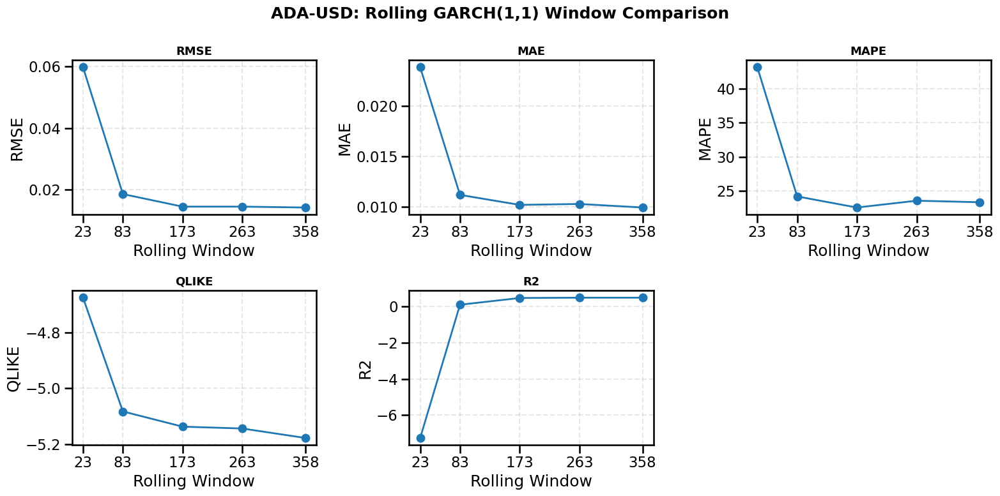

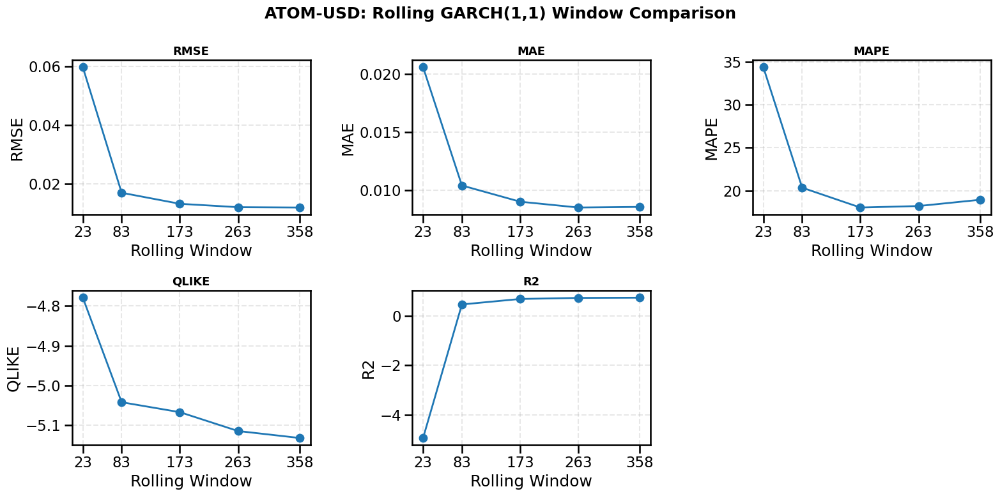

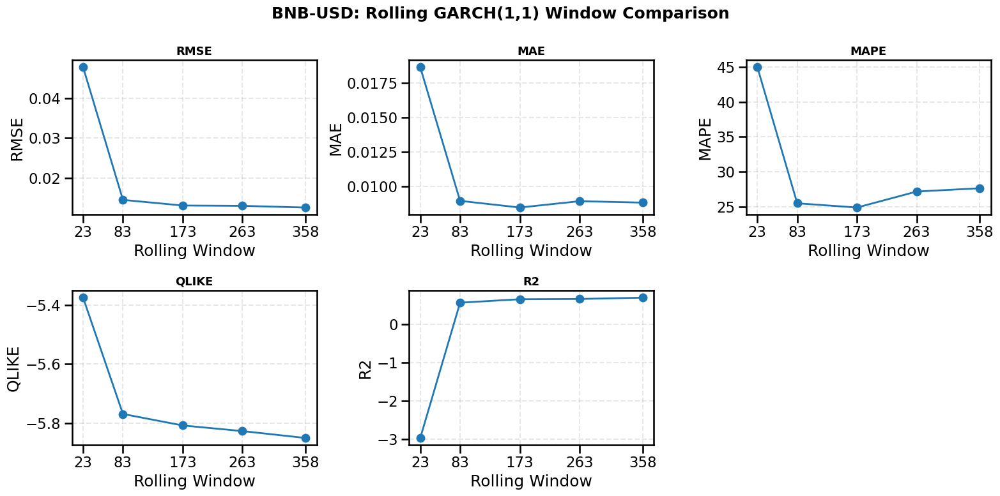

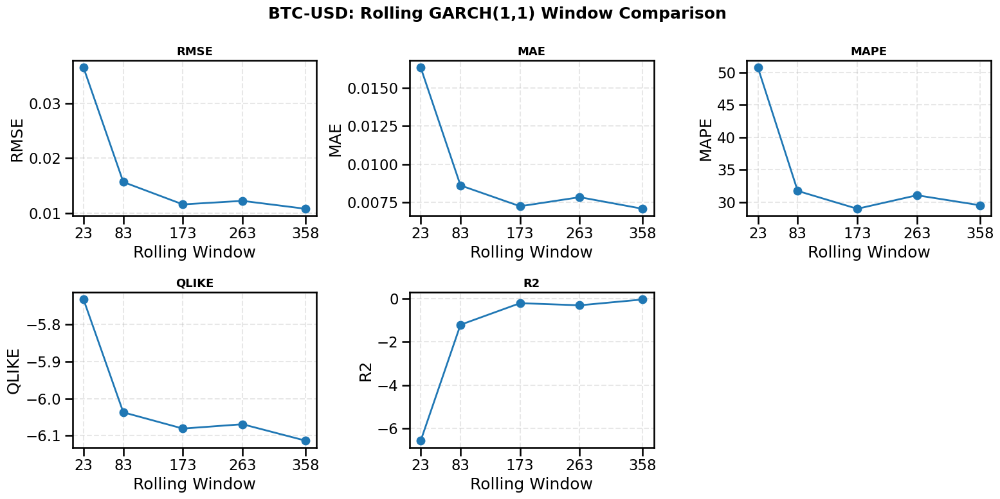

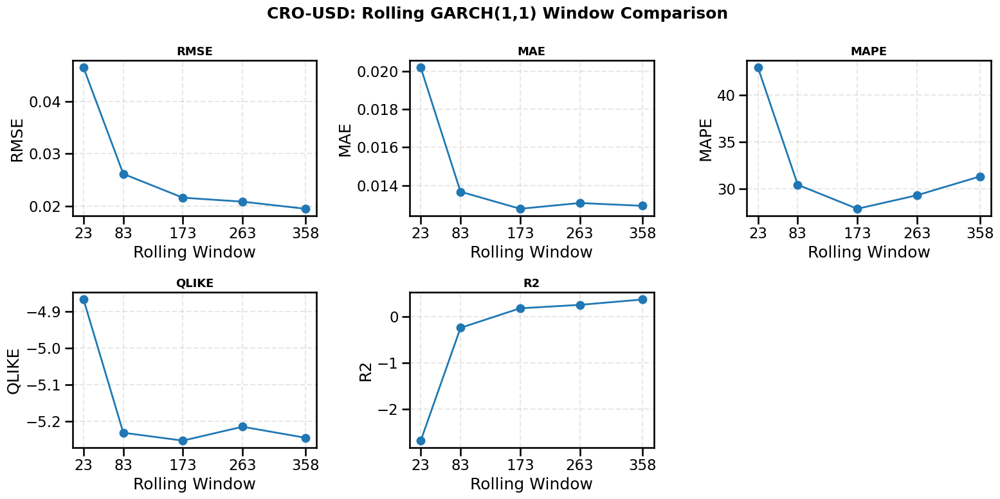

...

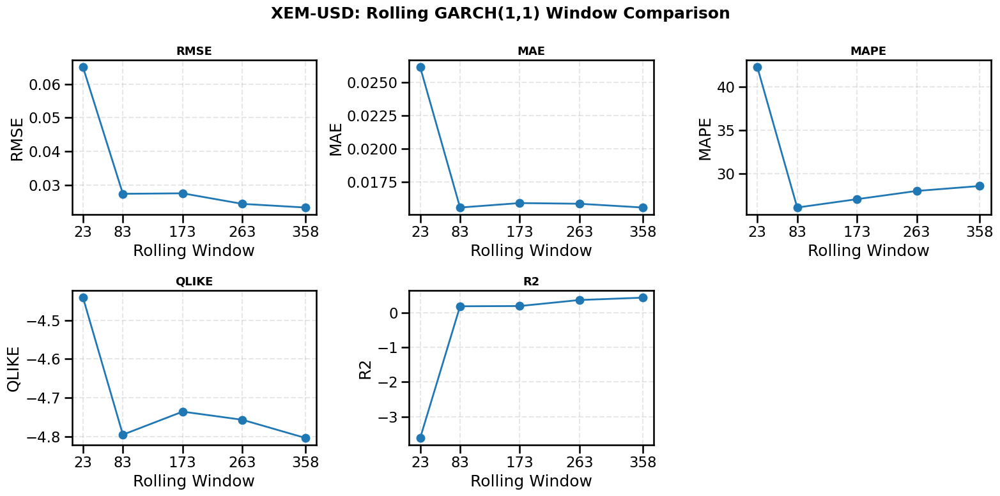

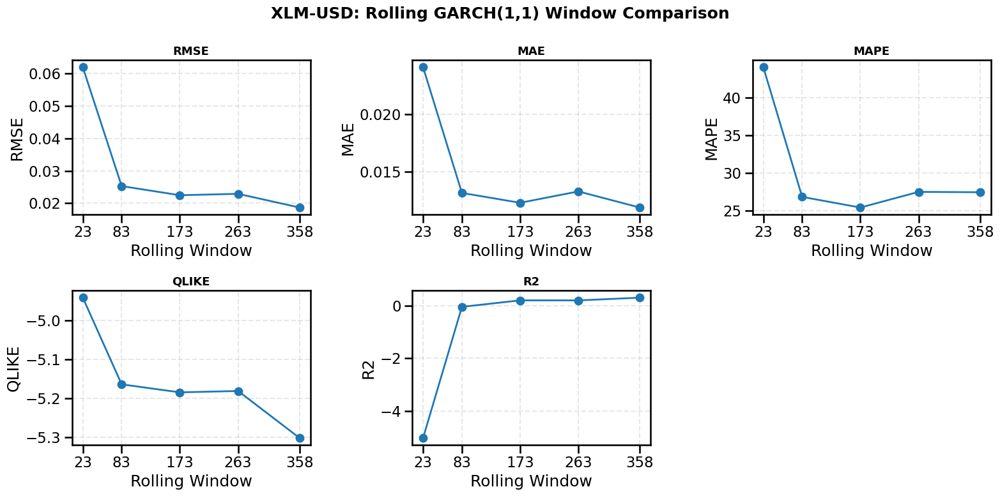

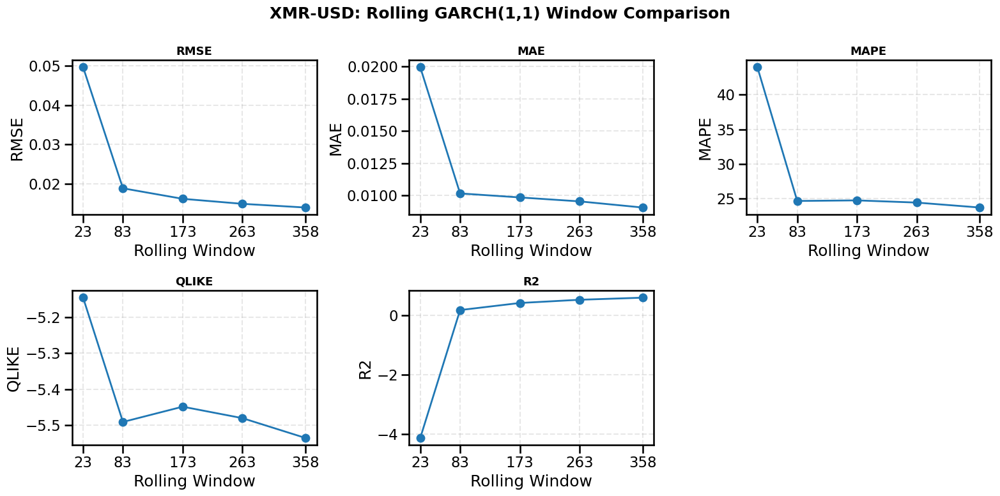

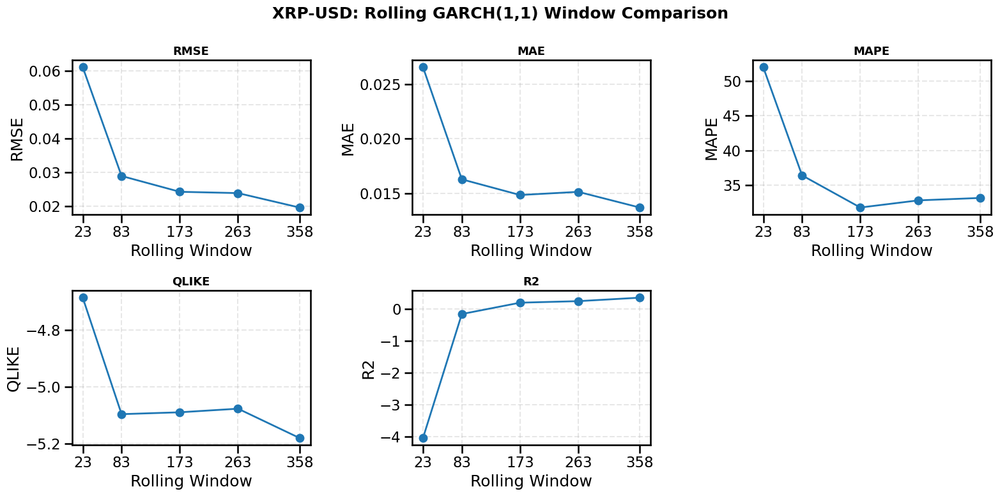

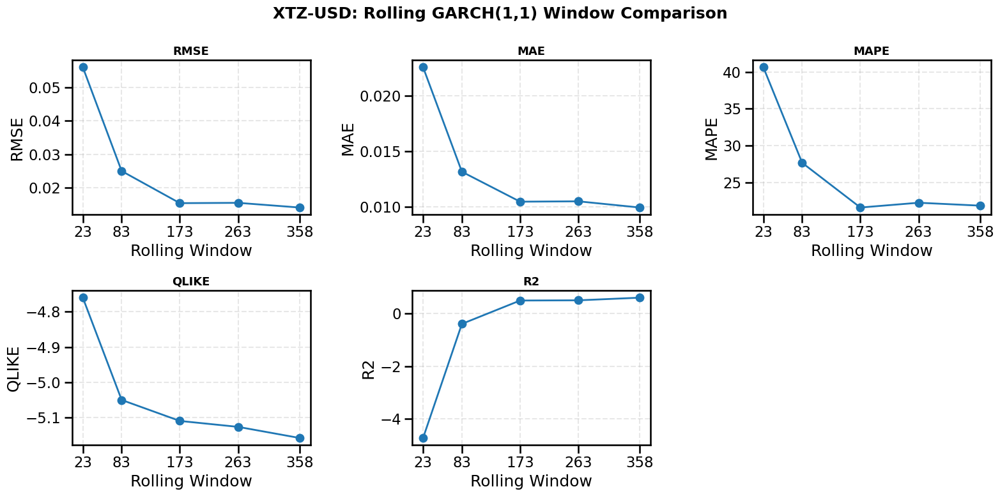

In [34]:
#=============================
# VISUALIZE GARCH EVALUATION METRICS FOR EACH TICKER
#=============================

sns.set_context(
    "talk",
    font_scale=1.0
)

metrics = [
    "RMSE",
    "MAE",
    "MAPE",
    "QLIKE",
    "R2"
]

windows = [23, 83, 173, 263, 358]

for ticker in sorted(garch_evaluation_df["Ticker"].unique()):

    coin = (
        garch_evaluation_df[
            garch_evaluation_df["Ticker"] == ticker
        ]
        .sort_values("Window")
    )

    fig, axes = plt.subplots(
        2,
        3,
        figsize=(16, 8)
    )

    axes = axes.flatten()

    for i, metric in enumerate(metrics):

        axes[i].plot(
            coin["Window"],
            coin[metric],
            marker="o",
            linewidth=2
        )

        axes[i].set_title(
            metric,
            fontsize=13,
            weight="bold"
        )

        axes[i].set_xlabel(
            "Rolling Window"
        )

        axes[i].set_ylabel(
            metric
        )

        axes[i].set_xticks(
            windows
        )

        axes[i].grid(
            linestyle="--",
            alpha=0.3
        )

    # Remove empty subplot
    fig.delaxes(axes[5])

    fig.suptitle(
        f"{ticker}: Rolling GARCH(1,1) Window Comparison",
        fontsize=18,
        weight="bold"
    )

    plt.tight_layout()

    plt.show()

In [35]:
#=============================
# BEST WINDOW FOR EACH METRIC BY METRICS
#=============================

summary = []

for ticker in sorted(garch_evaluation_df["Ticker"].unique()):

    coin = garch_evaluation_df[
        garch_evaluation_df["Ticker"] == ticker
    ]

    summary.append({

        "Ticker": ticker,

        "Best_RMSE_Window":
            coin.loc[
                coin["RMSE"].idxmin(),
                "Window"
            ],

        "Best_MAE_Window":
            coin.loc[
                coin["MAE"].idxmin(),
                "Window"
            ],

        "Best_MAPE_Window":
            coin.loc[
                coin["MAPE"].idxmin(),
                "Window"
            ],

        "Best_QLIKE_Window":
            coin.loc[
                coin["QLIKE"].idxmin(),
                "Window"
            ],

        "Best_R2_Window":
            coin.loc[
                coin["R2"].idxmax(),
                "Window"
            ]

    })

best_metric_df = pd.DataFrame(summary)

print(best_metric_df)

best_metric_df.to_csv(
    "best_window_by_metric.csv",
    index=False
)

print("\nSaved: best_window_by_metric.csv")

       Ticker  Best_RMSE_Window  Best_MAE_Window  Best_MAPE_Window  \
0     ADA-USD               358              358               173   
1    ATOM-USD               358              263               173   
2     BNB-USD               358              173               173   
3     BTC-USD               358              358               173   
4     CRO-USD               358              173               173   
5    DASH-USD               358              358               358   
6    DOGE-USD               358              358               358   
7     EOS-USD               358              358               358   
8     ETH-USD               263              263               263   
9     FIL-USD               358              358               263   
10     HT-USD                23               23               358   
11    LEO-USD               358              358               358   
12   LINK-USD               358              358               173   
13    LTC-USD       

In [36]:
#=============================
# RANK BEST WINDOW FOR EACH CRYPTOCURRENCY
#=============================

best_rank_results = []

for ticker in sorted(garch_evaluation_df["Ticker"].unique()):

    coin = (
        garch_evaluation_df[
            garch_evaluation_df["Ticker"] == ticker
        ]
        .copy()
    )

    coin["RMSE_Rank"] = coin["RMSE"].rank(method="min")
    coin["MAE_Rank"] = coin["MAE"].rank(method="min")
    coin["MAPE_Rank"] = coin["MAPE"].rank(method="min")
    coin["QLIKE_Rank"] = coin["QLIKE"].rank(method="min")
    coin["R2_Rank"] = coin["R2"].rank(
        ascending=False,
        method="min"
    )

    coin["Total_Rank"] = (
        coin["RMSE_Rank"]
        + coin["MAE_Rank"]
        + coin["MAPE_Rank"]
        + coin["QLIKE_Rank"]
        + coin["R2_Rank"]
    )

    best = coin.loc[
        coin["Total_Rank"].idxmin()
    ]

    best_rank_results.append({

        "Ticker": ticker,
        "Best_Window": best["Window"],
        "Total_Rank": best["Total_Rank"],
        "RMSE": best["RMSE"],
        "MAE": best["MAE"],
        "MAPE": best["MAPE"],
        "QLIKE": best["QLIKE"],
        "R2": best["R2"]

    })

best_rank_df = pd.DataFrame(best_rank_results)

print(best_rank_df)

best_rank_df.to_csv(
    "best_garch_window_rank.csv",
    index=False
)

print("\nSaved: best_garch_window_rank.csv")

       Ticker  Best_Window  Total_Rank      RMSE       MAE       MAPE  \
0     ADA-USD          358         6.0  0.014235  0.009945  23.303769   
1    ATOM-USD          358         8.0  0.011896  0.008539  18.928163   
2     BNB-USD          358         9.0  0.012586  0.008805  27.656252   
3     BTC-USD          358         6.0  0.010831  0.007080  29.498591   
4     CRO-USD          173         9.0  0.021612  0.012765  27.845383   
5    DASH-USD          358         5.0  0.014108  0.010143  21.848330   
6    DOGE-USD          358         5.0  0.037626  0.017481  30.820922   
7     EOS-USD          358         5.0  0.016004  0.011363  25.687549   
8     ETH-USD          263         6.0  0.010681  0.008268  24.398108   
9     FIL-USD          358         7.0  0.021827  0.015025  29.347633   
10     HT-USD           23        12.0  0.340082  0.088282  58.060281   
11    LEO-USD          358         6.0  0.013877  0.008675  37.053740   
12   LINK-USD          358         8.0  0.011100  0

In [37]:
#====================================================
# BEST GARCH WINDOW ACROSS ALL CRYPTOCURRENCIES
#====================================================

best_window_summary = (

    garch_evaluation_df

    .groupby("Window")

    .agg(

        Mean_MAE=("MAE", "mean"),

        Mean_RMSE=("RMSE", "mean"),

        Mean_MAPE=("MAPE", "mean"),

        Mean_QLIKE=("QLIKE", "mean"),

        Mean_R2=("R2", "mean")

    )

    .reset_index()

)

#====================================================
# RANK EACH METRIC
# Lower is better: RMSE, MAE, MAPE, QLIKE
# Higher is better: R2
#====================================================

best_window_summary["RMSE_Rank"] = (

    best_window_summary["Mean_RMSE"]

    .rank(ascending=True, method="min")

)

best_window_summary["MAE_Rank"] = (

    best_window_summary["Mean_MAE"]

    .rank(ascending=True, method="min")

)

best_window_summary["MAPE_Rank"] = (

    best_window_summary["Mean_MAPE"]

    .rank(ascending=True, method="min")

)

best_window_summary["QLIKE_Rank"] = (

    best_window_summary["Mean_QLIKE"]

    .rank(ascending=True, method="min")

)

best_window_summary["R2_Rank"] = (

    best_window_summary["Mean_R2"]

    .rank(ascending=False, method="min")

)

#====================================================
# TOTAL RANK
#====================================================

best_window_summary["Total_Rank"] = (

      best_window_summary["RMSE_Rank"]

    + best_window_summary["MAE_Rank"]

    + best_window_summary["MAPE_Rank"]

    + best_window_summary["QLIKE_Rank"]

    + best_window_summary["R2_Rank"]

)

#====================================================
# SORT BY TOTAL RANK
#====================================================

best_window_summary = (

    best_window_summary

    .sort_values("Total_Rank")

    .reset_index(drop=True)

)

#====================================================
# SELECT BEST WINDOW
#====================================================

best_window = int(

    best_window_summary.loc[0, "Window"]

)

#====================================================
# DISPLAY RESULTS
#====================================================

print("\n")
print("=" * 90)
print("BEST GARCH ROLLING WINDOW ACROSS ALL CRYPTOCURRENCIES")
print("=" * 90)

print(best_window_summary)

print("\n")
print("=" * 90)
print(f"BEST ROLLING WINDOW = {best_window} DAYS")
print("=" * 90)

#====================================================
# SAVE RESULTS
#====================================================

best_window_summary.to_csv(

    "best_garch_window_summary.csv",

    index=False

)

print("\nSaved:")
print("best_garch_window_summary.csv")



BEST GARCH ROLLING WINDOW ACROSS ALL CRYPTOCURRENCIES
   Window  Mean_MAE  Mean_RMSE  Mean_MAPE  Mean_QLIKE   Mean_R2  RMSE_Rank  \
0     173  0.014787   0.035445  26.496127   -4.953244  0.358647        1.0   
1     358  0.015261   0.037269  26.767460   -4.656351  0.454970        3.0   
2     263  0.015273   0.036891  26.814790   -4.866749  0.403929        2.0   
3      83  0.016058   0.040021  29.760272   -4.555868 -0.141881        4.0   
4      23  0.025250   0.066817  44.422687   -1.323340 -4.290006        5.0   

   MAE_Rank  MAPE_Rank  QLIKE_Rank  R2_Rank  Total_Rank  
0       1.0        1.0         1.0      3.0         7.0  
1       2.0        2.0         3.0      1.0        11.0  
2       3.0        3.0         2.0      2.0        12.0  
3       4.0        4.0         4.0      4.0        20.0  
4       5.0        5.0         5.0      5.0        25.0  


BEST ROLLING WINDOW = 173 DAYS

Saved:
best_garch_window_summary.csv


In [38]:
#====================================================
# SAVE EVALUATION RESULTS FOR 173-DAY ROLLING WINDOW
#====================================================

garch_173day_evaluation = (

    garch_evaluation_df[
        garch_evaluation_df["Window"] == 173
    ]

    .sort_values("Ticker")

    .reset_index(drop=True)

)

print("=" * 60)
print("GARCH(1,1) EVALUATION - 173-DAY ROLLING WINDOW")
print("=" * 60)

print(garch_173day_evaluation)

# Save CSV

garch_173day_evaluation.to_csv(

    "garch_173day_evaluation.csv",

    index=False

)

print("\nSaved:")
print("garch_173day_evaluation.csv")

GARCH(1,1) EVALUATION - 173-DAY ROLLING WINDOW
       Ticker  Window       MAE      RMSE       MAPE     QLIKE        R2
0     ADA-USD     173  0.010206  0.014523  22.526016 -5.137563  0.465024
1    ATOM-USD     173  0.008989  0.013172  18.024602 -5.067663  0.686809
2     BNB-USD     173  0.008448  0.013091  24.901450 -5.807249  0.662884
3     BTC-USD     173  0.007245  0.011625  28.950422 -6.080771 -0.204498
4     CRO-USD     173  0.012765  0.021612  27.845383 -5.253406  0.174003
5    DASH-USD     173  0.011049  0.017399  22.609844 -5.039694  0.495240
6    DOGE-USD     173  0.018232  0.040341  31.247282 -4.625256  0.159140
7     EOS-USD     173  0.014001  0.022212  33.474546 -5.025153  0.053583
8     ETH-USD     173  0.008629  0.012046  25.443617 -5.513540  0.330423
9     FIL-USD     173  0.016573  0.026588  30.592443 -4.719702 -0.012486
10     HT-USD     173  0.098223  0.436007  49.833287  0.663644  0.239552
11    LEO-USD     173  0.008979  0.014517  40.383712 -5.781457  0.327971
12  